# **Localização de Unidades de Atendimento Soroterápico no Estado de São Paulo**

Júlia Perez, Julia Ortiz, Maristela Santos, Cibele Russo, Oilson G. Junior, Hellen Santos

Apresentação de Pôster: XLV CNMAC - UNESP, Presidente Prudente

2026

#### Importação e leitura dos dados

*   `gdf_munic` : divisões de saúde, coordenadas e contorno de cada município

*   `gdf_postos` : coordenadas e soros de cada unidade de atendimento

*   `dados` : acidentes com animais peçonhentos ocorridos e atendidos no estado de São Paulo entre 2019 e 2024

*   `Dist` : matriz com as distâncias em segundos entre municípios e unidades de atendimento

*   `demandas` : média normalizada dos casos entre 2019 e 2025



In [ ]:
import gdown
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D

In [ ]:
!pip install gurobipy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.9/14.9 MB 75.9 MB/s eta 0:00:00


In [ ]:
import gurobipy
from gurobipy import Model, GRB, quicksum, Env

##### Importação

In [ ]:
# Divisões de Saúde do estado de São Paulo
!gdown 1U94NZDIqgTXQPaBtmv7ZYxJNowN7XxQW --output dados/divisoes.gpkg

Downloading...
From: https://drive.google.com/uc?id=1U94NZDIqgTXQPaBtmv7ZYxJNowN7XxQW
To: /content/dados/divisoes.gpkg
100% 15.0M/15.0M [00:00<00:00, 35.1MB/s]


In [ ]:
# Unidades de Atendimento
!gdown 1h4C_dfTmX-P_nGV_C-SPbXUE4O3MKbVN --output dados/postos_atualizados.gpkg

Downloading...
From: https://drive.google.com/uc?id=1h4C_dfTmX-P_nGV_C-SPbXUE4O3MKbVN
To: /content/dados/postos_atualizados.gpkg
100% 299k/299k [00:00<00:00, 70.3MB/s]


In [ ]:
# # Distância entre postos e cidades
!gdown 1n9EIPm93YiFXdEb-IB1-rKYMyY0uzmX4 --output dados/distancias_atualizadas.csv

Downloading...
From: https://drive.google.com/uc?id=1n9EIPm93YiFXdEb-IB1-rKYMyY0uzmX4
To: /content/dados/distancias_atualizadas.csv
100% 3.74M/3.74M [00:00<00:00, 41.8MB/s]


In [ ]:
# Demandas por Soro por município
#!gdown 1Oef7mHcFn1-2nEUSRmkZhka7Z7uI7zoH --output dados/demandas.csv

In [ ]:
# Registro dos acidentes com animais peçonhentos
!gdown 1Fc9r8P-PX8Uu3Cxnqf2fdGONrmFWTAZ2 --output dados/sinan.csv

Downloading...
From: https://drive.google.com/uc?id=1Fc9r8P-PX8Uu3Cxnqf2fdGONrmFWTAZ2
To: /content/dados/sinan.csv
100% 86.0M/86.0M [00:01<00:00, 47.2MB/s]


##### Leitura e ajustes

In [ ]:
# ---- Divisões de Saúde ---- #
gdf_munic = gpd.read_file('dados/divisoes.gpkg')
# gdf_munic = gpd.read_file('divisoes.gpkg')

# Segunda geometria para os municipios
gdf_munic['coordenadas'] = gpd.points_from_xy(gdf_munic['Longitude'], gdf_munic['Latitude'], crs = 4326)

# Agrupa por Divisão e une os municípios
limites_Macro = (gdf_munic.dissolve(by = 'Macrorregiao de Saude', as_index = False)[['Macrorregiao de Saude', 'geometry']])
limites_Regiao = (gdf_munic.dissolve(by = 'Regiao de Saude', as_index = False)[['Regiao de Saude','Macrorregiao de Saude', 'geometry']])
limites_DRS = (gdf_munic.dissolve(by = 'Departamento Regional de Saude', as_index = False)[['Departamento Regional de Saude', 'geometry']])
limites_GVE = (gdf_munic.dissolve(by = 'Grupo de Vigilancia Epidemiologica', as_index = False)[['Grupo de Vigilancia Epidemiologica', 'Departamento Regional de Saude', 'geometry']])

In [ ]:
# gdf_munic.head(3)

In [ ]:
# ---- Unidades de Atendimento ----
gdf_postos = gpd.read_file('dados/postos_atualizados.gpkg')
# gdf_postos = gpd.read_file('postos_atualizados.gpkg')

gdf_postos['coords'] = gdf_postos['geometry']

mun_geom = dict(zip(gdf_munic['Codigo Municipio'], gdf_munic['geometry']))
gdf_postos['geometry'] = gdf_postos['Codigo Municipio'].map(mun_geom)

In [ ]:
# gdf_postos.head(3)

In [ ]:
# ---- Distâncias ---- #
df_distancias = pd.read_csv('dados/distancias_atualizadas.csv', index_col = 0)

Distancias = df_distancias.to_numpy()

In [ ]:
# df_distancias.head(3)

In [ ]:
# ---- Demandas ---- #
# demandas = pd.read_csv('dados/demandas.csv', index_col = 0)

demandas = pd.read_csv('dados/DemandasMunicipais_CNMAC.csv', index_col = 0)

In [ ]:
# demandas.head(3)

In [ ]:
# ---- Acidentes com Animais Peçonhentos ---- #
colunas = ['NU_ANO', 'ANT_DT_ACI', 'SG_UF_NOT', 'ID_MUNICIP', 'ANT_UF', 'ANT_MUNIC_', 'ANT_TEMPO_', 'TP_ACIDENT',
           'ANI_TIPO_1', 'ANI_SERPEN', 'ANI_ARANHA', 'ANI_LAGART', 'TRA_CLASSI', 'CON_SOROTE', 'EVOLUCAO',
           'NU_AMPOLAS', 'NU_AMPOL_1','NU_AMPOL_8', 'NU_AMPOL_6', 'NU_AMPOL_4', 'NU_AMPO_7', 'NU_AMPO_5', 'NU_AMPOL_9', 'NU_AMPOL_3']

df = pd.read_csv('dados/sinan.csv', encoding = 'latin-1', usecols = colunas )

/tmp/ipykernel_4279/2758907858.py:6: DtypeWarning: Columns (11) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('dados/sinan.csv', encoding = 'latin-1', usecols = colunas )


In [ ]:
print(f'SINAN - {min(df['NU_ANO'])} a {max(df['NU_ANO'])}')
print(f'Número de registros: {len(df)}')

SINAN - 2007 a 2025
Número de registros: 672521


## Acidentes com Animais Peçonhentos (Sinan)

### Filtrando os dados do Sinan


In [ ]:
# BASE COMPLETA
print(f'SINAN/SP - {min(df['NU_ANO'])} a {max(df['NU_ANO'])}\n')

# Separando os casos notificados
print('QUANTIDADE DE CASOS NO ESTADO DE SÃO PAULO')
df = df[(df['SG_UF_NOT'] == 35) | (df['ANT_UF'] == 35)]
print(f'* Ocorridos e/ou atendidos : {len(df)}')

atendidos = (df['SG_UF_NOT'] == 35) & (df['ANT_UF'] != 35)
print(f'* Atendidos mas não ocorridos : {len(df[atendidos])}')
print(f'  Código dos estados = {df[atendidos]['ANT_UF'].unique()}')

ocorridos = (df['SG_UF_NOT'] != 35) & (df['ANT_UF'] == 35)
print(f'* Ocorridos mas não atendidos : {len(df[ocorridos])}')
print(f'  Código dos estados = {df[ocorridos]['SG_UF_NOT'].unique()}')

sp = df[(df['SG_UF_NOT'] == 35) & (df['ANT_UF'] == 35)]
print(f'* Ocorridos e atendidos : {len(sp)}')

# Verificando codigos registrados
print('\nREGISTROS COM ERRO NO CÓDIGO DO MUNICÍPIO')
Codigos_Municipios = gdf_munic['Codigo Municipio'].unique()
codigo_correto = sp['ID_MUNICIP'].isin(Codigos_Municipios) & sp['ANT_MUNIC_'].isin(Codigos_Municipios)
dados = sp[codigo_correto].copy()
dados.drop(['SG_UF_NOT', 'ANT_UF'], axis = 1, inplace = True)
print(f'Registros com erro: {len(sp) - len(dados)}')
print(f'Número de casos que serão considerados: {len(dados)}')

SINAN/SP - 2007 a 2025

QUANTIDADE DE CASOS NO ESTADO DE SÃO PAULO
* Ocorridos e/ou atendidos : 672521
* Atendidos mas não ocorridos : 0
  Código dos estados = []
* Ocorridos mas não atendidos : 0
  Código dos estados = []
* Ocorridos e atendidos : 672521

REGISTROS COM ERRO NO CÓDIGO DO MUNICÍPIO
Registros com erro: 414
Número de casos que serão considerados: 672107


### Organizando o df

In [ ]:
# Organizando o DataFrame final
dados.rename(columns =
 {
  'NU_ANO' : 'Ano', 'ANT_DT_ACI' : 'Data',
  'ID_MUNICIP' : 'Destino', 'ANT_MUNIC_' : 'Origem',
  'ANT_TEMPO_' : 'Tempo', 'TP_ACIDENT' : 'Acidente',
  'CON_SOROTE' : 'Soroterapia', 'EVOLUCAO' : 'Evolucao',
  'ANI_TIPO_1' : 'Outro Animal', 'ANI_SERPEN' : 'Serpente',
  'ANI_ARANHA' : 'Aranha', 'ANI_LAGART' : 'Lagarta',
  'TRA_CLASSI' : 'Gravidade',
  'NU_AMPOLAS' : 'Ampolas SAB' , 'NU_AMPOL_1' : 'Ampolas SAC',
  'NU_AMPOL_8' : 'Ampolas SAA', 'NU_AMPOL_6' : 'Ampolas SABLa',
  'NU_AMPOL_4' : 'Ampolas SAEl', 'NU_AMPO_7' : 'Ampolas SALox',
  'NU_AMPO_5' : 'Ampolas SABC', 'NU_AMPOL_9' : 'Ampolas SAEsc',
  'NU_AMPOL_3' : 'Ampolas SALon',
 }, inplace = True)
dados['Origem'] = dados['Origem'].astype(int)

# Dicionários
dic_acidentes = {1: 'Serpente', 2: 'Aranha', 3: 'Escorpião', 4: 'Lagarta', 5: 'Abelha', 6: 'Outros', 9: 'Não informado'}
dic_tempos = {1 : 'até 1h', 2 : '1-3 h', 3 : '3-6 h', 4 : '6-12 h', 5 : '12-24 h', 6 : '24+ h', 9 : 'Ignorado'}
dic_soroterapia = {1 : 'Sim', 2 : 'Não', 9 : 'Ignorado'}
dic_evolucao = {1 : 'Cura', 2 : 'Óbito pelo acidente', 3 : 'Óbito por outra causa', 9 : 'Ignorado'}

dados['Acidente'] = dados['Acidente'].map(dic_acidentes)
dados['Tempo'] = dados['Tempo'].map(dic_tempos)
dados['Soroterapia'] = dados['Soroterapia'].map(dic_soroterapia)
dados['Evolucao'] = dados['Evolucao'].map(dic_evolucao)

In [ ]:
# Adicionando informações
colunas = ['RRAS Orig', 'RRAS Dest', 'RS Orig', 'RS Dest', 'GVE Orig', 'GVE Dest', 'DRS Orig', 'DRS Dest']
dados[colunas] = None

for m in Codigos_Municipios:
    dados.loc[dados['Origem'] == m, 'RRAS Orig'] = gdf_munic[gdf_munic['Codigo Municipio'] == m]['Codigo Macrorregiao de Saude'].values[0]
    dados.loc[dados['Origem'] == m, 'RS Orig'] = gdf_munic[gdf_munic['Codigo Municipio'] == m]['Codigo Regiao de Saude'].values[0]
    dados.loc[dados['Origem'] == m, 'GVE Orig'] = gdf_munic[gdf_munic['Codigo Municipio'] == m]['Grupo de Vigilancia Epidemiologica'].values[0]
    dados.loc[dados['Origem'] == m, 'DRS Orig'] = gdf_munic[gdf_munic['Codigo Municipio'] == m]['Departamento Regional de Saude'].values[0]

    dados.loc[dados['Destino'] == m, 'RRAS Dest'] = gdf_munic[gdf_munic['Codigo Municipio'] == m]['Codigo Macrorregiao de Saude'].values[0]
    dados.loc[dados['Destino'] == m, 'RS Dest'] = gdf_munic[gdf_munic['Codigo Municipio'] == m]['Codigo Regiao de Saude'].values[0]
    dados.loc[dados['Destino'] == m, 'GVE Dest'] = gdf_munic[gdf_munic['Codigo Municipio'] == m]['Grupo de Vigilancia Epidemiologica'].values[0]
    dados.loc[dados['Destino'] == m, 'DRS Dest'] = gdf_munic[gdf_munic['Codigo Municipio'] == m]['Departamento Regional de Saude'].values[0]

In [ ]:
dados

,Ano,Destino,Data,Origem,Tempo,Acidente,Outro Animal,Serpente,Aranha,Lagarta,...,Ampolas SALon,Evolucao,RRAS Orig,RRAS Dest,RS Orig,RS Dest,GVE Orig,GVE Dest,DRS Orig,DRS Dest
0,2007,350280,2007-01-24,350280,até 1h,Abelha,NaN,NaN,NaN,NaN,...,0.0,Cura,3536,3536,35021,35021,ARAÇATUBA,ARAÇATUBA,DRS II - ARAÇATUBA,DRS II - ARAÇATUBA
1,2007,354850,2007-01-29,351870,Ignorado,Serpente,NaN,9.0,NaN,NaN,...,0.0,NaN,3520,3520,35041,35041,SANTOS,SANTOS,DRS IV - BAIXADA SANTISTA,DRS IV - BAIXADA SANTISTA
2,2007,351660,2007-01-13,351670,6-12 h,Abelha,NaN,NaN,NaN,NaN,...,0.0,Cura,3533,3533,35093,35093,MARÍLIA,MARÍLIA,DRS IX - MARÍLIA,DRS IX - MARÍLIA
3,2007,351660,2007-01-10,351660,1-3 h,Aranha,NaN,NaN,9.0,NaN,...,0.0,Cura,3533,3533,35093,35093,MARÍLIA,MARÍLIA,DRS IX - MARÍLIA,DRS IX - MARÍLIA
4,2007,351660,2006-12-28,350600,1-3 h,Abelha,NaN,NaN,NaN,NaN,...,0.0,Cura,3518,3533,35062,35093,BAURU,MARÍLIA,DRS VI - BAURU,DRS IX - MARÍLIA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
672516,2025,355450,20251228,355450,1-3 h,Escorpião,NaN,NaN,NaN,NaN,...,NaN,Cura,3519,3519,35163,35163,SOROCABA,SOROCABA,DRS XVI - SOROCABA,DRS XVI - SOROCABA
672517,2025,354620,20251220,351870,24+ h,Aranha,NaN,NaN,9.0,NaN,...,NaN,Cura,3520,3529,35041,35101,SANTOS,PIRACICABA,DRS IV - BAIXADA SANTISTA,DRS X - PIRACICABA
672518,2025,353870,20251228,353870,até 1h,Aranha,NaN,NaN,9.0,NaN,...,NaN,Cura,3529,3529,35103,35103,PIRACICABA,PIRACICABA,DRS X - PIRACICABA,DRS X - PIRACICABA
672519,2025,353080,20251228,353080,até 1h,Escorpião,NaN,NaN,NaN,NaN,...,NaN,Cura,3528,3528,35141,35141,SÃO JOÃO DA BOA VISTA,SÃO JOÃO DA BOA VISTA,DRS XIV - SÃO JOÃO DA BOA VISTA,DRS XIV - SÃO JOÃO DA BOA VISTA


### Análise Exploratória

In [ ]:
minimo = dados['Ano'].min()
maximo = dados['Ano'].max()

tipos_acidente = ['Abelha', 'Aranha', 'Escorpião', 'Lagarta', 'Serpente', 'Outros', 'Não informado']

print(f'Número de casos registrados entre {minimo} e {maximo}: {len(dados)}')

Número de casos registrados entre 2007 e 2025: 672107


#### Quantidade de acidentes por tipo, ano, soroterapia e evolução do caso

In [ ]:
print('\n ---- TIPO DE ACIDENTE POR ANO ----\n')
acidente_ano = dados.groupby(['Acidente', 'Ano']).size().reset_index(name='Casos').pivot(index='Acidente', columns='Ano', values='Casos')
acidente_ano = acidente_ano.fillna(0)

acidente_ano['Total por Animal'] = acidente_ano.sum(axis=1)
acidente_ano.loc['Total por Ano'] = acidente_ano.sum()

acidente_ano['Percentual'] = (acidente_ano['Total por Animal'] / acidente_ano.loc['Total por Ano', 'Total por Animal']) * 100

df_dados_acidente = acidente_ano.sort_values(by='Total por Animal', ascending=False)
df_total_acidente = acidente_ano.loc[['Total por Ano']]

acidente_ano = pd.concat([df_dados_acidente, df_total_acidente]).round(1)
acidente_ano


 ---- TIPO DE ACIDENTE POR ANO ----



Ano,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,...,2018,2019,2020,2021,2022,2023,2024,2025,Total por Animal,Percentual
Acidente,,,,,,,,,,,,,,,,,,,,,
Total por Ano,10617,12565,15299,15331,16346,19252,22212,22165,25926,28499,...,44239,49679,49423,45593,56120,70041,61454,72902,672107,100.0
Escorpião,4345,5322,6446,7121,7070,9125,11270,12385,15196,17377,...,29859,33418,36535,33641,42507,48614,41931,51317,434705,64.7
Aranha,2157,2482,3462,3092,3278,3499,4393,3498,4219,4335,...,5216,6385,4971,4663,5404,8922,7773,9114,91864,13.7
Abelha,1389,1578,1842,1830,2070,2325,2471,2615,2664,2565,...,3859,4293,3164,2938,3465,5630,6075,6059,60145,8.9
Serpente,1451,1692,1879,1741,1894,1894,1753,1862,1870,1743,...,2204,2228,2193,2191,1989,2237,2216,2284,37518,5.6
Outros,334,404,486,455,768,935,867,680,691,739,...,1253,1372,904,958,1160,1902,1728,1936,18585,2.8
Não informado,519,556,615,582,758,798,837,745,880,1071,...,980,1118,809,602,846,1347,1089,1344,16500,2.5
Lagarta,422,531,569,510,508,676,621,380,406,669,...,868,865,847,600,749,1389,642,848,12790,1.9
Total por Ano,10617,12565,15299,15331,16346,19252,22212,22165,25926,28499,...,44239,49679,49423,45593,56120,70041,61454,72902,672107,100.0


In [ ]:
dados_recentes = dados[dados['Ano'].isin([2023, 2024, 2025])]
print('\n ---- TIPO DE ACIDENTE POR ANO ----\n')
acidente_ano = dados_recentes.groupby(['Acidente', 'Ano']).size().reset_index(name='Casos').pivot(index='Acidente', columns='Ano', values='Casos')
acidente_ano = acidente_ano.fillna(0)

acidente_ano['Total por Animal'] = acidente_ano.sum(axis=1)
acidente_ano.loc['Total por Ano'] = acidente_ano.sum()

acidente_ano['Percentual'] = (acidente_ano['Total por Animal'] / acidente_ano.loc['Total por Ano', 'Total por Animal']) * 100

df_dados_acidente = acidente_ano.sort_values(by='Total por Animal', ascending=False)
df_total_acidente = acidente_ano.loc[['Total por Ano']]

acidente_ano = pd.concat([df_dados_acidente, df_total_acidente]).round(1)
acidente_ano


 ---- TIPO DE ACIDENTE POR ANO ----



Ano,2023,2024,2025,Total por Animal,Percentual
Acidente,,,,,
Total por Ano,70041,61454,72902,204397,100.0
Escorpião,48614,41931,51317,141862,69.4
Aranha,8922,7773,9114,25809,12.6
Abelha,5630,6075,6059,17764,8.7
Serpente,2237,2216,2284,6737,3.3
Outros,1902,1728,1936,5566,2.7
Não informado,1347,1089,1344,3780,1.8
Lagarta,1389,642,848,2879,1.4
Total por Ano,70041,61454,72902,204397,100.0


In [ ]:
print('\n ---- ÓBITOS POR TIPO DE ACIDENTE ----\n')
obitos = (dados['Evolucao'] ==  'Óbito pelo acidente')

obitos = dados[obitos].groupby(['Acidente', 'Ano']).size().reset_index(name = 'Casos').pivot(index = 'Acidente', columns = 'Ano', values = 'Casos')
obitos['Total'] = obitos.sum(axis = 1)

obitos.fillna(0).sort_values(by = 'Total', ascending = False).astype(int)


 ---- ÓBITOS POR TIPO DE ACIDENTE ----



Ano,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,2025,Total
Acidente,,,,,,,,,,,,,,,,,,,,
Abelha,1,1,5,4,3,5,6,5,3,4,4,5,11,12,8,3,11,19,15,125
Escorpião,2,5,2,1,2,3,5,2,6,7,8,13,11,17,7,11,7,5,5,119
Serpente,6,2,3,1,10,6,1,3,8,8,7,6,10,7,7,5,10,5,8,113
Aranha,0,1,1,0,0,0,0,0,1,1,1,3,1,1,2,1,2,1,2,18
Não informado,0,1,0,1,1,0,0,0,0,0,0,0,0,1,1,0,0,0,1,6
Lagarta,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,2


In [ ]:
print('\n ---- SOROTERAPIA POR TIPO DE ACIDENTE ----\n')

com_soro = (dados['Soroterapia'] == 'Sim')

soroterapia = dados[com_soro].groupby(['Acidente', 'Ano']).size().reset_index(name = 'Casos').pivot(index = 'Acidente', columns = 'Ano', values = 'Casos')
soroterapia['Total'] = soroterapia.sum(axis = 1)

soroterapia.sort_values(by = 'Total', ascending = False)


 ---- SOROTERAPIA POR TIPO DE ACIDENTE ----



Ano,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,2025,Total
Acidente,,,,,,,,,,,,,,,,,,,,
Serpente,1092,1313,1436,1340,1446,1404,1256,1337,1353,1213,1535,1454,1480,1478,1509,1315,1428,1441,1457,26287
Escorpião,268,376,387,380,372,474,628,573,616,603,808,1197,1290,1381,1274,1607,1634,1401,1572,16841
Aranha,280,261,338,338,316,346,403,266,250,227,287,326,347,285,307,400,534,420,497,6428
Não informado,18,34,31,11,20,10,25,12,21,17,20,15,20,8,13,19,17,16,23,350
Abelha,7,12,14,7,14,20,15,23,19,10,22,19,12,13,22,19,22,22,23,315
Outros,2,8,14,12,16,13,12,14,9,14,9,11,22,12,19,26,18,28,25,284
Lagarta,7,4,9,3,6,18,7,6,8,9,5,15,12,8,5,13,23,8,2,168


In [ ]:
print('\n ---- RESUMO POR TIPO DE ACIDENTE ----\n')
tabela_acidentes = dados.groupby('Acidente').size().reset_index(name = 'Casos').set_index('Acidente')

obitos_counts = dados[dados['Evolucao'] ==  'Óbito pelo acidente'].groupby('Acidente').size()
tabela_acidentes['Óbitos'] = obitos_counts

soro_counts = dados[dados['Soroterapia'] == 'Sim'].groupby('Acidente').size()
tabela_acidentes['Soroterapia'] = soro_counts

# Ajustes
tabela_acidentes = tabela_acidentes.fillna(0).astype(int)
tabela_acidentes = tabela_acidentes.reindex(tipos_acidente)

total = tabela_acidentes.sum().to_frame().T
total.index = ['Total']

tabela_acidentes = pd.concat([tabela_acidentes, total])

tabela_acidentes#.to_latex()


 ---- RESUMO POR TIPO DE ACIDENTE ----



,Casos,Óbitos,Soroterapia
Abelha,60145,125,315
Aranha,91864,18,6428
Escorpião,434705,119,16841
Lagarta,12790,2,168
Serpente,37518,113,26287
Outros,18585,0,284
Não informado,16500,6,350
Total,672107,383,50673


In [ ]:
print('\n ---- TEMPO DE ATENDIMENTO POR TIPO DE ACIDENTE ----\n')
ordem_tempos = ['até 1h', '1-3 h', '3-6 h', '6-12 h', '12-24 h', '24+ h', 'Ignorado']
dados.groupby(['Acidente', 'Tempo']).size().reset_index(name = 'Casos').pivot(index = 'Acidente', columns = 'Tempo', values = 'Casos').reindex(columns=ordem_tempos)


 ---- TEMPO DE ATENDIMENTO POR TIPO DE ACIDENTE ----



Tempo,até 1h,1-3 h,3-6 h,6-12 h,12-24 h,24+ h,Ignorado
Acidente,,,,,,,
Abelha,27207,9249,3154,1635,4658,7548,5539
Aranha,39622,18633,6433,2772,3903,11980,6439
Escorpião,329813,55500,12959,6052,4034,3483,17165
Lagarta,6548,3103,957,252,211,480,1001
Não informado,4531,1939,997,625,1243,3452,3233
Outros,6429,2547,1159,636,1395,3641,2277
Serpente,18682,9844,3459,1058,852,1114,1768


#### Municípios vulneráveis

In [ ]:
dados.value_counts('Origem')

,count
Origem,
353870,27706
354340,15777
355030,13188
350280,12802
354980,12231
...,...
350730,37
354085,33
353715,30


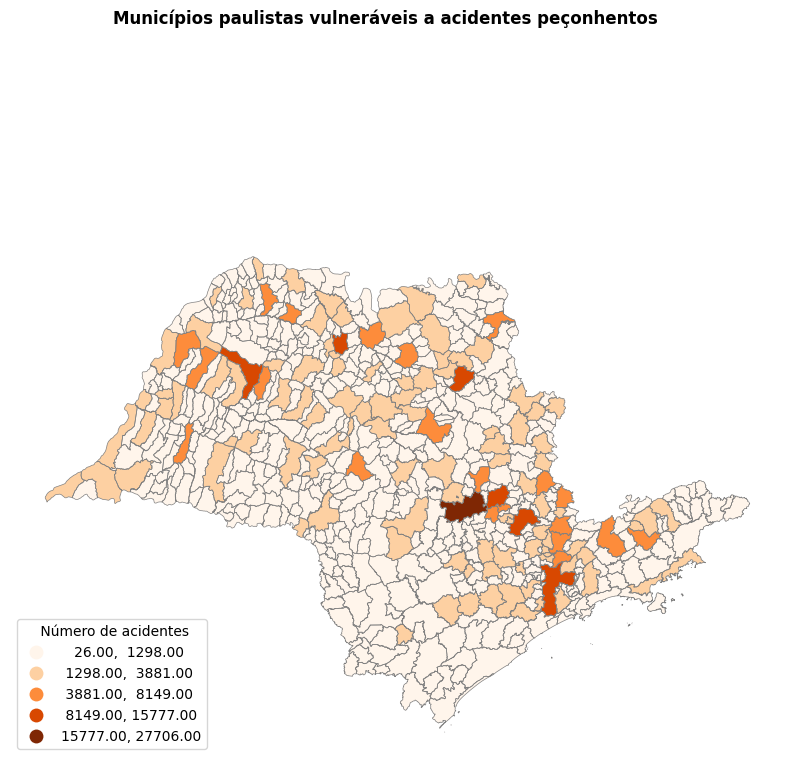

In [ ]:
import mapclassify as mc

gdf_acidentes = gdf_munic[['Municipio','geometry']].copy()
aux = dados.value_counts('Origem')


codigos = aux.keys().to_list()
nro_casos = aux.to_list()

# troca código pelo índice
for i in range(len(codigos)):
  cd = codigos[i]
  codigos[i] = gdf_munic[gdf_munic['Codigo Municipio'] == cd].index[0]

for i, m in enumerate(codigos):
    gdf_acidentes.loc[m, 'Nro Casos'] = nro_casos[i]

classes = mc.NaturalBreaks(gdf_acidentes['Nro Casos'].dropna())
ax = gdf_acidentes.plot(
    column = 'Nro Casos',
    legend = True,
    k = classes.k,
    scheme = 'naturalbreaks',
    cmap = 'Oranges',
    figsize = (10, 10),
    legend_kwds = {
        "title": " Número de acidentes",
        "ncols" : 1,
        "loc" : 'lower left'
    },
    missing_kwds={
        "color": "lightgrey",
        "label": "Nenhum",
    }
)

gdf_munic.boundary.plot(ax = ax, linewidth = 0.5, color = 'gray')

plt.axis('off')
plt.suptitle('Municípios paulistas vulneráveis a acidentes peçonhentos', fontsize = 12, fontweight = "bold")
plt.savefig("figs/municipios-vulneraveis.png", dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
# municipios com mais casos
nb = classes.yb
idx = [i for i, x in enumerate(nb) if x == 4]
for i in idx:
  nome = gdf_acidentes.iloc[i]['Municipio']
  print(f'{nome} - índice {i}')

Piracicaba - índice 146


#### Fluxos

In [ ]:
fluxo_intermunicipal = dados[dados['Origem'] != dados['Destino']]
fluxo_intermunicipal

,Ano,Destino,Data,Origem,Tempo,Acidente,Outro Animal,Serpente,Aranha,Lagarta,...,Ampolas SALon,Evolucao,RRAS Orig,RRAS Dest,RS Orig,RS Dest,GVE Orig,GVE Dest,DRS Orig,DRS Dest
1,2007,354850,2007-01-29,351870,Ignorado,Serpente,NaN,9.0,NaN,NaN,...,0.0,NaN,3520,3520,35041,35041,SANTOS,SANTOS,DRS IV - BAIXADA SANTISTA,DRS IV - BAIXADA SANTISTA
2,2007,351660,2007-01-13,351670,6-12 h,Abelha,NaN,NaN,NaN,NaN,...,0.0,Cura,3533,3533,35093,35093,MARÍLIA,MARÍLIA,DRS IX - MARÍLIA,DRS IX - MARÍLIA
4,2007,351660,2006-12-28,350600,1-3 h,Abelha,NaN,NaN,NaN,NaN,...,0.0,Cura,3518,3533,35062,35093,BAURU,MARÍLIA,DRS VI - BAURU,DRS IX - MARÍLIA
108,2007,352590,2007-01-09,352340,12-24 h,Aranha,NaN,NaN,9.0,NaN,...,0.0,Cura,3528,3527,35072,35073,CAMPINAS,CAMPINAS,DRS VII - CAMPINAS,DRS VII - CAMPINAS
122,2007,352900,2007-01-30,350150,1-3 h,Abelha,NaN,NaN,NaN,NaN,...,0.0,Cura,3533,3533,35093,35093,MARÍLIA,MARÍLIA,DRS IX - MARÍLIA,DRS IX - MARÍLIA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
672465,2025,353870,20251228,354515,Ignorado,Escorpião,NaN,NaN,NaN,NaN,...,NaN,Cura,3529,3529,35103,35103,PIRACICABA,PIRACICABA,DRS X - PIRACICABA,DRS X - PIRACICABA
672491,2025,354390,20251228,352110,até 1h,Escorpião,NaN,NaN,NaN,NaN,...,NaN,Cura,3529,3529,35104,35104,PIRACICABA,PIRACICABA,DRS X - PIRACICABA,DRS X - PIRACICABA
672504,2025,353870,20251228,355040,até 1h,Escorpião,NaN,NaN,NaN,NaN,...,NaN,Cura,3529,3529,35103,35103,PIRACICABA,PIRACICABA,DRS X - PIRACICABA,DRS X - PIRACICABA
672509,2025,350660,20251228,354500,3-6 h,Aranha,NaN,NaN,2.0,NaN,...,NaN,Ignorado,3525,3525,35011,35011,MOGI DAS CRUZES,MOGI DAS CRUZES,DRS I - CAPITAL,DRS I - CAPITAL


In [ ]:
rras_diferente = fluxo_intermunicipal[fluxo_intermunicipal['RRAS Orig'] != fluxo_intermunicipal['RRAS Dest']]
#rras_diferente
len(rras_diferente)

9653

In [ ]:
rs_diferente = fluxo_intermunicipal[fluxo_intermunicipal['RS Orig'] != fluxo_intermunicipal['RS Dest']]
#rs_diferente
len(rs_diferente)

14166

In [ ]:
gve_diferente = fluxo_intermunicipal[fluxo_intermunicipal['GVE Orig'] != fluxo_intermunicipal['GVE Dest']]
#gve_diferente
len(gve_diferente)

10196

In [ ]:
drs_diferente = fluxo_intermunicipal[fluxo_intermunicipal['DRS Orig'] != fluxo_intermunicipal['DRS Dest']]
#drs_diferente
len(drs_diferente)

4702

In [ ]:
print("Fluxos intermunicipais")
print(f'Número de casos:{len(dados)}')
print(f'Número de deslocamentos:{len(fluxo_intermunicipal)}')
(len(fluxo_intermunicipal)*100)/len(dados)

Fluxos intermunicipais
Número de casos:672107
Número de deslocamentos:60434


8.991723044098633

## Unidades de Atendimento

### Divisões do Estado de São Paulo

In [ ]:
# Quantidades
nro_macros = len(limites_Macro)
nro_regioes = len(limites_Regiao)
nro_drs = len(limites_DRS)
nro_gve = len(limites_GVE)

print(f'Macros: {nro_macros}\nRegiões: {nro_regioes}\nDRS: {nro_drs}\nGVE: {nro_gve}')

Macros: 19
Regiões: 62
DRS: 17
GVE: 28


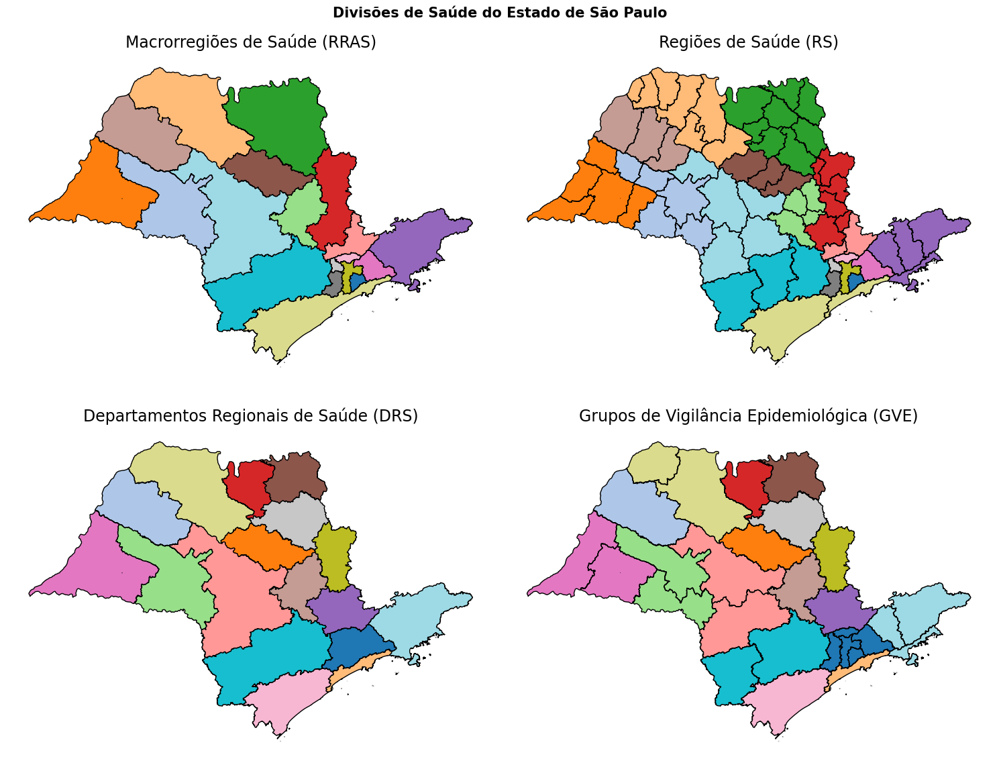

In [ ]:
# Mapa estático para comparar as divisões nacionais e estaduais
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize = (15,12))

limites_Macro.plot(ax = ax1, cmap = 'tab20', edgecolor = 'black')
ax1.set_title('Macrorregiões de Saúde (RRAS)', fontsize = 17,)
ax1.axis('off')

limites_Macro.plot(ax = ax2, cmap = 'tab20')
limites_Regiao.boundary.plot(ax = ax2, edgecolor = 'black', linewidth = 1)
ax2.set_title('Regiões de Saúde (RS)', fontsize = 17,)
ax2.axis('off')

limites_DRS.plot(ax = ax3, cmap = 'tab20', edgecolor = 'black')
ax3.set_title('Departamentos Regionais de Saúde (DRS)', fontsize = 17,)
ax3.axis('off')

limites_DRS.plot(ax = ax4, cmap = 'tab20')
limites_GVE.boundary.plot(ax = ax4, cmap = 'tab20', edgecolor = 'black', linewidth = 1)
ax4.set_title('Grupos de Vigilância Epidemiológica (GVE)', fontsize = 17,)
ax4.axis('off')


plt.suptitle('Divisões de Saúde do Estado de São Paulo', fontsize=15, fontweight="bold")
plt.tight_layout()
plt.savefig("figs/divisoes-saude.png", dpi=300, bbox_inches='tight')
plt.show()

### Pontos Estratégicos de Soro Antiveneno (PESA)

In [ ]:
# 1. Definir a lista de colunas que devem ser tratadas
colunas_animais = [
    'Loxoscélico', 'Fonêutrico', 'Botrópico', 'Crotálico',
    'Elapídico', 'Laquético', 'Escorpiônico', 'Lonômico' , 'Tem Soro'
]

# 2. Preencher os valores NaN com 0 apenas nessas colunas
gdf_postos[colunas_animais] = gdf_postos[colunas_animais].fillna(0)
gdf_postos

,Codigo Municipio,Municipio,Indice Municipio,Codigo Regiao de Saude,GVE,Nome Posto,Endereço,Telefone,24H,Tem Soro,...,Loxoscélico,Fonêutrico,Botrópico,Crotálico,Elapídico,Laquético,Escorpiônico,Lonômico,geometry,coords
0,350010,Adamantina,475,35091,GVE 19 MARILIA,SANTA CASA DE MISERICÓRDIA - ADAMANTINA,"R. JOAQUIM LUIZ VIANA, 209",(18) 3502-2200,1.0,1.0,...,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,"MULTIPOLYGON (((-51.05218 -21.7097, -51.05232 ...",POINT (-51.07063 -21.69281)
1,350020,Adolfo,533,35156,GVE 29 SAO JOSE DO RIO PRETO,UNIDADE BÁSICA DE SAÚDE DE ADOLFO\n,"RUA MANOEL CARLOS FIGUEIREDO FERRAZ, ADOLFO - ...",(17) 3814-1295,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"MULTIPOLYGON (((-49.61249 -21.2611, -49.61249 ...",POINT (-49.64184 -21.23312)
2,350030,Aguaí,306,35142,GVE 26 SAO JOAO DA BOA VISTA,PRONTO SOCORRO MUNICIPAL DE AGUAI,"R. Alexandrino de Alençar, 127 - Vila Bom Gost...",(19) 3653-7179,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"MULTIPOLYGON (((-47.01254 -22.00527, -47.01219...",POINT (-46.98109 -22.06347)
3,350040,Águas da Prata,370,35142,GVE 26 SAO JOAO DA BOA VISTA,UNIDADE INTEGRADA DE SAÚDE LEOPOLDO DE ARAÚJO\n,"AVENIDA LÁZARO ANSELMO RAMOS, 200 - JARDIM ÁGU...",(19) 3642-1303,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"MULTIPOLYGON (((-46.71875 -21.95837, -46.71878...",POINT (-46.72514 -21.94658)
4,350050,Águas de Lindóia,453,35074,GVE 17 CAMPINAS,HOSPITAL SÃO CAMILO - ÁGUAS DE LINDÓIA,"RUA SANTA CATARINA, 158",(19) 3824-1122,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,"MULTIPOLYGON (((-46.61761 -22.51172, -46.61864...",POINT (-46.63425 -22.47367)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
662,355690,Vista Alegre do Alto,249,35052,GVE 14 BARRETOS,UNIDADE BASICA DE SAUDE ANTONIO APPARECIDO FIO...,"R. Manoel Marquês, 186, Vista Alegre do Alto -...",(16) 3287-1547,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"MULTIPOLYGON (((-48.61715 -21.20002, -48.61776...",POINT (-48.62835 -21.17729)
663,355695,Vitória Brasil,263,35153,GVE 30 JALES,UBS DE VITORIA BRASIL,"R. Mato Grosso, 738, Vitória Brasil - SP, 1571...",(17) 3642-1170,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"MULTIPOLYGON (((-50.45066 -20.15889, -50.45186...",POINT (-50.48364 -20.20118)
664,355700,Votorantim,309,35163,GVE 31 SOROCABA,HOSPITAL MUNICIPAL DR LAURO ROBERTO FOGACA,"RUA JOAO WALTER, 181",(15) 3353-9300,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"MULTIPOLYGON (((-47.43843 -23.52501, -47.43814...",POINT (-47.44973 -23.54452)
665,355710,Votuporanga,393,35157,GVE 29 SAO JOSE DO RIO PRETO,SANTA CASA DE MISERICÓRDIA - VOTUPORANGA,RUA MINAS GERAIS 3051,(17) 3405-9133,1.0,1.0,...,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,"MULTIPOLYGON (((-49.9832 -20.57103, -49.98408 ...",POINT (-49.9786 -20.42646)


In [ ]:
tem_soro = (gdf_postos['Tem Soro'] == 1)

postos_com_soro = gdf_postos[tem_soro]
municipios = postos_com_soro['Codigo Municipio'].unique()
print(f'Número de municípios que possuem algum tipo de soro soro: {len(municipios)}\n')
print(f'Número de PESA: {len(postos_com_soro)}\n')


print(f'Número de Unidades de Atendimento com soro')
for tipo in ['Botrópico', 'Crotálico', 'Elapídico', 'Laquético', 'Loxoscélico', 'Fonêutrico', 'Escorpiônico', 'Lonômico']:
  filtro = (gdf_postos[tipo] == 1)
  nro = len(gdf_postos[filtro])
  print(f'{tipo} - {nro}')

Número de municípios que possuem algum tipo de soro soro: 220

Número de PESA: 242

Número de Unidades de Atendimento com soro
Botrópico - 185
Crotálico - 169
Elapídico - 40
Laquético - 6
Loxoscélico - 182
Fonêutrico - 182
Escorpiônico - 239
Lonômico - 46


In [ ]:
# Postos SEM SORO Escorpiônico
postos_com_soro[postos_com_soro['Escorpiônico'] == 0]

,Codigo Municipio,Municipio,Indice Municipio,Codigo Regiao de Saude,GVE,Nome Posto,Endereço,Telefone,24H,Tem Soro,...,Loxoscélico,Fonêutrico,Botrópico,Crotálico,Elapídico,Laquético,Escorpiônico,Lonômico,geometry,coords
171,351510,Embu-Guaçu,561,35013,GVE 10 OSASCO,UNIDADE MISTA DE SAÚDE - EMBU GUAÇU,"RUA CELESTINO APA, Nº 50",(11) 4661-1884,1.0,1.0,...,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,"MULTIPOLYGON (((-46.79974 -23.77087, -46.79954...",POINT (-46.81134 -23.83827)
486,354260,Registro,136,35121,GVE 23 REGISTRO,HOSPITAL SÃO JOÃO,"RUA KIHEIJI NASUNO, 165 - CENTRO",(13) 3821-1111,1.0,1.0,...,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,"MULTIPOLYGON (((-47.68369 -24.54969, -47.68458...",POINT (-47.84666 -24.48701)
487,354260,Registro,136,35121,GVE 23 REGISTRO,HOSPITAL REGIONAL DE REGISTRO,"RODOVIA REGIS BITENCOURT, S/Nº KM499",(13) 3500-8944,1.0,1.0,...,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,"MULTIPOLYGON (((-47.68369 -24.54969, -47.68458...",POINT (-47.85628 -24.53032)


#### Visualização dos PESA

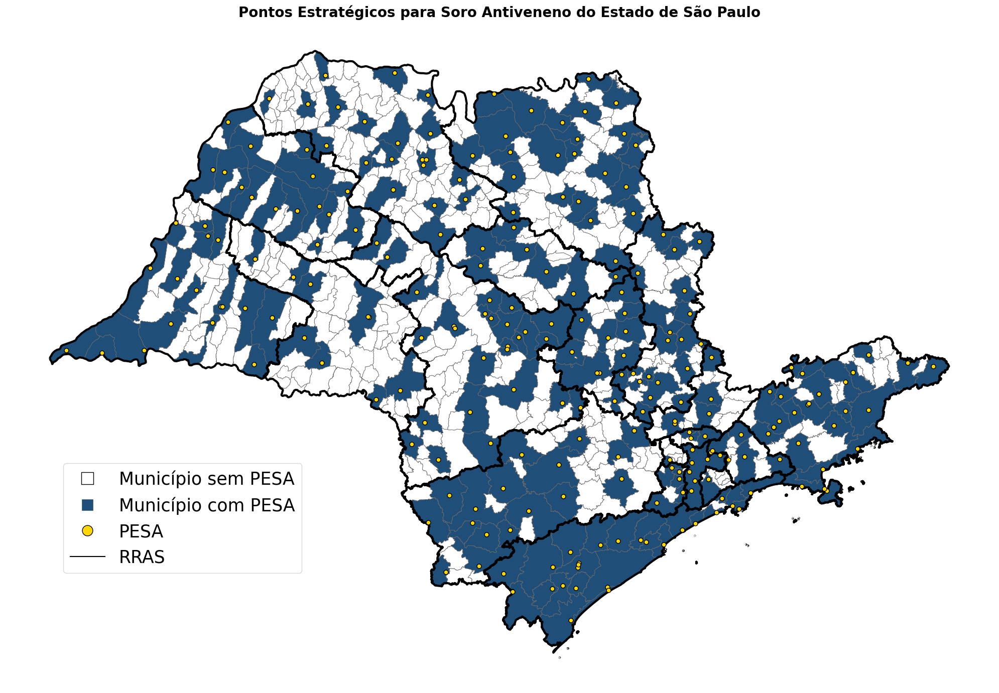

In [ ]:
cols_soro = ['Botrópico', 'Crotálico', 'Elapídico', 'Laquético',
             'Fonêutrico','Loxoscélico', 'Escorpiônico', 'Lonômico']
rede_atual = gdf_munic[['Codigo Municipio', 'Municipio', 'Macrorregiao de Saude', 'geometry']].copy()
for i, row in rede_atual.iterrows():
  mun = row['Municipio']
  filtro = (gdf_postos['Municipio'] == mun) & (gdf_postos['Tem Soro'] == 1)
  postos_soro = gdf_postos[filtro]
  if not postos_soro.empty:
    rede_atual.loc[i, 'Nro Postos'] = len(postos_soro)
    rede_atual.loc[i, 'Tem Soro'] = 1
  for j, soro in enumerate(cols_soro):
    com_soro = postos_soro[postos_soro[soro] == 1]
    if not com_soro.empty:
      rede_atual.loc[i, soro] = 1


# 1. Configuração de estilo
cmap = mcolors.ListedColormap(['white','#1f4e79']) # azul
fig, ax = plt.subplots(figsize=(20, 20))

# Plotar a COBERTURA (Municípios - Polígonos)
rede_atual.plot(
    ax = ax,
    column = 'Tem Soro',
    cmap = cmap,
    vmin = 0,
    vmax = 1,
    zorder = 1
)

# Fronteiras cinzas
rede_atual.boundary.plot(
    ax = ax,
    color = 'dimgray',
    linewidth = 0.5,
    zorder = 2
)

# 3. Plotar os POSTOS (Pontos)
# Filtramos os postos que possuem o soro k
postos_com_soro = gdf_postos[gdf_postos['Tem Soro'] == 1]

postos_com_soro.set_geometry('coords').plot(
    ax = ax,
    marker = 'o',
    color = '#ffd700',     # Amarelo
    # color = 'black',        # Preto
    markersize = 40,       # Tamanho do ponto
    edgecolor = 'black',   # Contorno
    linewidth = 1,
    zorder = 5             # Camada superior
)

# Contorno das RRAS
limites_Macro.boundary.plot(ax = ax, color = 'black', linewidth = 3, zorder = 4)

# --- Legendas e Títulos (Mantidos) ---
legenda = [
    Line2D([0], [0], marker='s', color='w', label='Município sem PESA',
            markerfacecolor='white', markersize=17, markeredgecolor='black'),
    Line2D([0], [0], marker='s', color='w', label='Município com PESA',
            markerfacecolor='#1f4e79',
            markersize=17),
    Line2D([0], [0], marker='o', color='w', label='PESA',
            markerfacecolor='#ffd700',
            markersize=15, markeredgecolor='black'),
    Line2D([0], [0], linestyle='-', color='black', label='RRAS')
]

ax.legend(handles = legenda, loc = 'upper left', bbox_to_anchor = (0.05, 0.35),
          fontsize = 25, frameon = True)
ax.axis('off')

plt.title(f'Pontos Estratégicos para Soro Antiveneno do Estado de São Paulo',
          fontsize = 20, fontweight = "bold")
plt.tight_layout()
plt.savefig("rede-atual.png", dpi = 300, bbox_inches = 'tight')
plt.show()

In [ ]:
# Verifica se todas as Macrorregiões tem todos os soros
for macro in limites_Macro['Macrorregiao de Saude'].unique():
  municipios_macro = rede_atual[rede_atual['Macrorregiao de Saude'] == macro]
  for soro in cols_soro:
    filtro = (municipios_macro[soro] == 1)
    if municipios_macro[filtro].empty:
      print(f'Macrorregião {macro} não possui {soro}')

Macrorregião RRAS1 não possui Botrópico
Macrorregião RRAS1 não possui Crotálico
Macrorregião RRAS1 não possui Elapídico
Macrorregião RRAS1 não possui Laquético
Macrorregião RRAS1 não possui Fonêutrico
Macrorregião RRAS1 não possui Loxoscélico
Macrorregião RRAS1 não possui Lonômico
Macrorregião RRAS10 não possui Laquético
Macrorregião RRAS11 não possui Laquético
Macrorregião RRAS12 não possui Laquético
Macrorregião RRAS14 não possui Laquético
Macrorregião RRAS15 não possui Laquético
Macrorregião RRAS16 não possui Laquético
Macrorregião RRAS16 não possui Lonômico
Macrorregião RRAS18 não possui Laquético
Macrorregião RRAS19 não possui Laquético
Macrorregião RRAS2 não possui Laquético
Macrorregião RRAS3 não possui Laquético
Macrorregião RRAS4 não possui Laquético
Macrorregião RRAS5 não possui Botrópico
Macrorregião RRAS5 não possui Crotálico
Macrorregião RRAS5 não possui Elapídico
Macrorregião RRAS5 não possui Laquético
Macrorregião RRAS5 não possui Fonêutrico
Macrorregião RRAS5 não possui

In [ ]:
# Verifica se todas as Macrorregiões tem todos os soros
for macro in limites_Macro['Macrorregiao de Saude'].unique():
  municipios_macro = rede_atual[rede_atual['Macrorregiao de Saude'] == macro]
  for soro in cols_soro:
    filtro = (municipios_macro[soro] == 1)
    if municipios_macro[filtro].empty:
      print(f'Macrorregião {macro} não possui {soro}')

Macrorregião RRAS1 não possui Botrópico
Macrorregião RRAS1 não possui Crotálico
Macrorregião RRAS1 não possui Elapídico
Macrorregião RRAS1 não possui Laquético
Macrorregião RRAS1 não possui Fonêutrico
Macrorregião RRAS1 não possui Loxoscélico
Macrorregião RRAS1 não possui Lonômico
Macrorregião RRAS10 não possui Laquético
Macrorregião RRAS11 não possui Laquético
Macrorregião RRAS12 não possui Laquético
Macrorregião RRAS14 não possui Laquético
Macrorregião RRAS15 não possui Laquético
Macrorregião RRAS16 não possui Laquético
Macrorregião RRAS16 não possui Lonômico
Macrorregião RRAS18 não possui Laquético
Macrorregião RRAS19 não possui Laquético
Macrorregião RRAS2 não possui Laquético
Macrorregião RRAS3 não possui Laquético
Macrorregião RRAS4 não possui Laquético
Macrorregião RRAS5 não possui Botrópico
Macrorregião RRAS5 não possui Crotálico
Macrorregião RRAS5 não possui Elapídico
Macrorregião RRAS5 não possui Laquético
Macrorregião RRAS5 não possui Fonêutrico
Macrorregião RRAS5 não possui

In [ ]:
rede_atual

,Codigo Municipio,Municipio,Macrorregiao de Saude,geometry,Nro Postos,Tem Soro,Botrópico,Crotálico,Elapídico,Fonêutrico,Loxoscélico,Escorpiônico,Lonômico,Laquético
0,351300,Cotia,RRAS4,"MULTIPOLYGON (((-46.91759 -23.65551, -46.91764...",1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,NaN
1,353282,Nova Campina,RRAS8,"MULTIPOLYGON (((-48.89989 -24.10036, -48.87064...",1.0,1.0,NaN,NaN,NaN,1.0,1.0,1.0,NaN,NaN
2,350250,Aparecida,RRAS17,"MULTIPOLYGON (((-45.21167 -22.8313, -45.21076 ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,354330,Ribeirão Pires,RRAS1,"MULTIPOLYGON (((-46.39477 -23.6375, -46.39463 ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,354200,Quintana,RRAS10,"MULTIPOLYGON (((-50.28246 -22.08134, -50.28251...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
640,351565,Fernão,RRAS10,"MULTIPOLYGON (((-49.53521 -22.32074, -49.53275...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
641,353760,Peruíbe,RRAS7,"MULTIPOLYGON (((-47.03124 -24.42842, -47.03119...",1.0,1.0,1.0,1.0,NaN,1.0,1.0,1.0,NaN,NaN
642,353630,Patrocínio Paulista,RRAS13,"MULTIPOLYGON (((-47.22536 -20.6995, -47.2253 -...",1.0,1.0,1.0,1.0,NaN,1.0,1.0,1.0,NaN,NaN
643,350120,Álvares Florence,RRAS12,"MULTIPOLYGON (((-49.94386 -20.37764, -49.94464...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
limites_Macro['Macrorregiao de Saude'].unique()

array(['RRAS1', 'RRAS10', 'RRAS11', 'RRAS12', 'RRAS13', 'RRAS14',
       'RRAS15', 'RRAS16', 'RRAS17', 'RRAS18', 'RRAS19', 'RRAS2', 'RRAS3',
       'RRAS4', 'RRAS5', 'RRAS6', 'RRAS7', 'RRAS8', 'RRAS9'], dtype=object)

In [ ]:
todas_macros = limites_Macro['Macrorregiao de Saude'].unique()

for soro in cols_soro:
  print(soro)
  municipios_com_soro = rede_atual[rede_atual[soro] == 1]
  macros_com_soro = municipios_com_soro['Macrorregiao de Saude'].unique()
  print(macros_com_soro)
  print(len(macros_com_soro))
  print(len(macros_com_soro) / len(todas_macros))
  for macro in limites_Macro['Macrorregiao de Saude'].unique():
    if macro not in macros_com_soro:
      print(macro)
  print('\n')

Botrópico
['RRAS4' 'RRAS16' 'RRAS7' 'RRAS9' 'RRAS8' 'RRAS13' 'RRAS11' 'RRAS10'
 'RRAS6' 'RRAS15' 'RRAS2' 'RRAS12' 'RRAS19' 'RRAS18' 'RRAS17' 'RRAS14'
 'RRAS3']
17
0.8947368421052632
RRAS1
RRAS5


Crotálico
['RRAS4' 'RRAS16' 'RRAS9' 'RRAS8' 'RRAS13' 'RRAS11' 'RRAS10' 'RRAS6'
 'RRAS7' 'RRAS15' 'RRAS2' 'RRAS12' 'RRAS19' 'RRAS18' 'RRAS17' 'RRAS14'
 'RRAS3']
17
0.8947368421052632
RRAS1
RRAS5


Elapídico
['RRAS4' 'RRAS6' 'RRAS13' 'RRAS15' 'RRAS7' 'RRAS14' 'RRAS9' 'RRAS17'
 'RRAS11' 'RRAS10' 'RRAS12' 'RRAS2' 'RRAS8' 'RRAS18' 'RRAS16' 'RRAS19'
 'RRAS3']
17
0.8947368421052632
RRAS1
RRAS5


Laquético
['RRAS6' 'RRAS13' 'RRAS9' 'RRAS8' 'RRAS17']
5
0.2631578947368421
RRAS1
RRAS10
RRAS11
RRAS12
RRAS14
RRAS15
RRAS16
RRAS18
RRAS19
RRAS2
RRAS3
RRAS4
RRAS5
RRAS7


Fonêutrico
['RRAS4' 'RRAS8' 'RRAS16' 'RRAS7' 'RRAS9' 'RRAS13' 'RRAS11' 'RRAS10'
 'RRAS6' 'RRAS15' 'RRAS2' 'RRAS12' 'RRAS19' 'RRAS18' 'RRAS17' 'RRAS14'
 'RRAS3']
17
0.8947368421052632
RRAS1
RRAS5


Loxoscélico
['RRAS4' 'RRAS8' 'RRAS16' 'RRAS7' 

In [ ]:
gdf_munic

,Codigo Municipio,Municipio,Codigo Macrorregiao de Saude,Macrorregiao de Saude,Codigo Regiao de Saude,Regiao de Saude,Codigo Departamento Regional de Saude,Departamento Regional de Saude,Codigo Grupo de Vigilancia Epidemiologica,Grupo de Vigilancia Epidemiologica,Area km2,Populacao Estimada IBGE 2022,Latitude,Longitude,geometry,coordenadas
0,351300,Cotia,3523,RRAS4,35013,MANANCIAIS,1,DRS I - CAPITAL,10,OSASCO,323.994,274413,-23.603889,-46.918889,"MULTIPOLYGON (((-46.91759 -23.65551, -46.91764...",POINT (-46.91889 -23.60389)
1,353282,Nova Campina,3519,RRAS8,35162,ITAPEVA,16,DRS XVI - SOROCABA,32,ITAPEVA,385.375,8497,-24.122530,-48.905404,"MULTIPOLYGON (((-48.89989 -24.10036, -48.87064...",POINT (-48.9054 -24.12253)
2,350250,Aparecida,3526,RRAS17,35172,CIRCUITO DA FE E VALE HISTORICO,17,DRS XVII - TAUBATÉ,33,TAUBATÉ,120.890,32569,-22.851552,-45.234092,"MULTIPOLYGON (((-45.21167 -22.8313, -45.21076 ...",POINT (-45.23409 -22.85155)
3,354330,Ribeirão Pires,3534,RRAS1,35015,GRANDE ABC,1,DRS I - CAPITAL,7,SANTO ANDRÉ,98.972,115559,-23.713418,-46.416093,"MULTIPOLYGON (((-46.39477 -23.6375, -46.39463 ...",POINT (-46.41609 -23.71342)
4,354200,Quintana,3533,RRAS10,35093,MARILIA,9,DRS IX - MARÍLIA,19,MARÍLIA,318.937,7038,-22.070551,-50.308652,"MULTIPOLYGON (((-50.28246 -22.08134, -50.28251...",POINT (-50.30865 -22.07055)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
640,351565,Fernão,3533,RRAS10,35093,MARILIA,9,DRS IX - MARÍLIA,19,MARÍLIA,100.504,1656,-22.359539,-49.520950,"MULTIPOLYGON (((-49.53521 -22.32074, -49.53275...",POINT (-49.52095 -22.35954)
641,353760,Peruíbe,3520,RRAS7,35041,BAIXADA SANTISTA,4,DRS IV - BAIXADA SANTISTA,25,SANTOS,326.216,68352,-24.321811,-46.997745,"MULTIPOLYGON (((-47.03124 -24.42842, -47.03119...",POINT (-46.99775 -24.32181)
642,353630,Patrocínio Paulista,3530,RRAS13,35081,TRES COLINAS,8,DRS VIII - FRANCA,18,FRANCA,602.848,14512,-20.638361,-47.280124,"MULTIPOLYGON (((-47.22536 -20.6995, -47.2253 -...",POINT (-47.28012 -20.63836)
643,350120,Álvares Florence,3531,RRAS12,35157,VOTUPORANGA,15,DRS XV - SÃO JOSÉ DO RIO PRETO,29,SÃO JOSÉ DO RIO PRETO,362.411,3915,-20.293602,-49.933016,"MULTIPOLYGON (((-49.94386 -20.37764, -49.94464...",POINT (-49.93302 -20.2936)


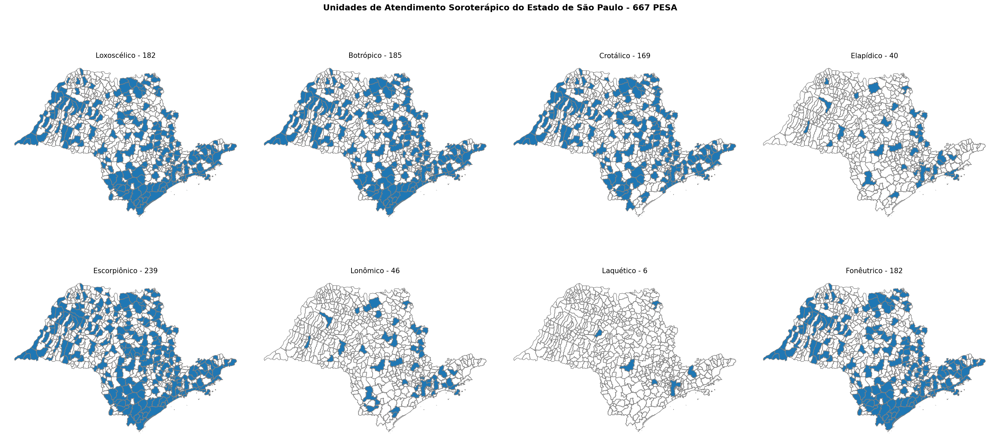

In [ ]:
# Mapa estático para verificar municipios com atendimento
fig, ((ax1, ax2, ax3, ax4), (ax5, ax6, ax7, ax8)) = plt.subplots(2, 4, figsize = (30,15))

loxo = (gdf_postos['Loxoscélico'] == 1)
gdf_munic.boundary.plot(ax = ax1, edgecolor = 'grey', linewidth = 1)
gdf_postos[loxo].plot(ax = ax1)
ax1.set_title(f'Loxoscélico - {len(gdf_postos[loxo])}', fontsize = 15)
ax1.axis('off')

botr = (gdf_postos['Botrópico'] == 1)
gdf_munic.boundary.plot(ax = ax2, edgecolor = 'grey', linewidth = 1)
gdf_postos[botr].plot(ax = ax2)
ax2.set_title(f'Botrópico - {len(gdf_postos[botr])}', fontsize = 15)
ax2.axis('off')

crot = (gdf_postos['Crotálico'] == 1)
gdf_munic.boundary.plot(ax = ax3, edgecolor = 'grey', linewidth = 1)
gdf_postos[crot].plot(ax = ax3)
ax3.set_title(f'Crotálico - {len(gdf_postos[crot])}', fontsize = 15)
ax3.axis('off')

elap = (gdf_postos['Elapídico'] == 1)
gdf_munic.boundary.plot(ax = ax4, edgecolor = 'grey', linewidth = 1)
gdf_postos[elap].plot(ax = ax4)
ax4.set_title(f'Elapídico - {len(gdf_postos[elap])}', fontsize = 15)
ax4.axis('off')

esco = (gdf_postos['Escorpiônico'] == 1)
gdf_munic.boundary.plot(ax = ax5, edgecolor = 'grey', linewidth = 1)
gdf_postos[esco].plot(ax = ax5)
ax5.set_title(f'Escorpiônico - {len(gdf_postos[esco])}', fontsize = 15)
ax5.axis('off')

lono = (gdf_postos['Lonômico'] == 1)
gdf_munic.boundary.plot(ax = ax6, edgecolor = 'grey', linewidth = 1)
gdf_postos[lono].plot(ax = ax6)
ax6.set_title(f'Lonômico - {len(gdf_postos[lono])}', fontsize = 15)
ax6.axis('off')

laqu = (gdf_postos['Laquético'] == 1)
gdf_munic.boundary.plot(ax = ax7, edgecolor = 'grey', linewidth = 1)
gdf_postos[laqu].plot(ax = ax7)
ax7.set_title(f'Laquético - {len(gdf_postos[laqu])}', fontsize = 15)
ax7.axis('off')

fone = (gdf_postos['Fonêutrico'] == 1)
gdf_munic.boundary.plot(ax = ax8, edgecolor = 'grey', linewidth = 1)
gdf_postos[fone].plot(ax = ax8)
ax8.set_title(f'Fonêutrico - {len(gdf_postos[fone])}', fontsize = 15)
ax8.axis('off')

plt.suptitle(f'Unidades de Atendimento Soroterápico do Estado de São Paulo - {len(tem_soro)} PESA', fontsize = 18, fontweight = "bold")
plt.tight_layout()
plt.savefig("figs/PESA-soro.png", dpi=300, bbox_inches='tight')
plt.show()

## Análise da Cobertura

In [ ]:
# ---- Tipos de soro ----
cols_soro = [
    'Botrópico', 'Crotálico', 'Elapídico', 'Laquético',
    'Loxoscélico', 'Fonêutrico', 'Escorpiônico', 'Lonômico'
]

# ---- Soro por animal ----
dict_soros = {
    'Serpente': [
        'Botrópico',  # Atende Jararaca (SAB, SABC, SABL)
        'Crotálico',  # Atende Cascavel (SAC, SABC)
        'Elapídico',  # Atende Coral (SAE)
        'Laquético'   # Atende Surucucu (SAL, SABL)
    ],
    'Aranha': [
        'Loxoscélico', # Específico para Aranha Marrom (SALox)
        'Fonêutrico',  # Específico para Armadeira (SAAr)
        # Nota: SAAr (Antiaracnídico) atende ambos os casos acima
    ],
    'Escorpião': [
        'Escorpiônico' # Atende Tityus (SAEES ou SAAr)
    ],
    'Lagarta': [
        'Lonômico'     # Atende Lonomia (SALon)
    ]
}

dict_tempo = {
    'Escorpião': 3000,   # 50 minutos
    'Serpente': 3000,
    'Aranha': 3000,
    'Lagarta': 3000
}

In [ ]:
# ---- Parâmetros  ----
gdf_munic = gdf_munic.reset_index(drop=True)
gdf_postos = gdf_postos.reset_index(drop=True)

# Filtra apenas postos ativos e reseta o índice
# gdf_postos_ativos = gdf_postos[gdf_postos['Tem Soro'] == 1].reset_index(drop=True)
gdf_postos_ativos = gdf_postos[gdf_postos['Tem Soro'] == 1].reset_index(drop=False)                 ###########################################################

# Conjuntos do modelo
M = range(len(gdf_munic))
P = range(len(gdf_postos_ativos))
K = range(len(cols_soro))

print(f'Soros: {len(K)}, Municípios: {len(M)}, Postos com soro: {len(P)}')

Soros: 8, Municípios: 645, Postos com soro: 242


In [ ]:
gdf_postos_ativos.head(3)

,index,Codigo Municipio,Municipio,Indice Municipio,Codigo Regiao de Saude,GVE,Nome Posto,Endereço,Telefone,24H,...,Loxoscélico,Fonêutrico,Botrópico,Crotálico,Elapídico,Laquético,Escorpiônico,Lonômico,geometry,coords
0,0,350010,Adamantina,475,35091,GVE 19 MARILIA,SANTA CASA DE MISERICÓRDIA - ADAMANTINA,"R. JOAQUIM LUIZ VIANA, 209",(18) 3502-2200,1.0,...,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,"MULTIPOLYGON (((-51.05218 -21.7097, -51.05232 ...",POINT (-51.07063 -21.69281)
1,4,350050,Águas de Lindóia,453,35074,GVE 17 CAMPINAS,HOSPITAL SÃO CAMILO - ÁGUAS DE LINDÓIA,"RUA SANTA CATARINA, 158",(19) 3824-1122,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,"MULTIPOLYGON (((-46.61761 -22.51172, -46.61864...",POINT (-46.63425 -22.47367)
2,11,350100,Altinópolis,167,35133,GVE 24 RIBEIRAO PRETO,HOSPITAL DE MISERICÓRDIA - ALTINÓPOLIS,"RUA CORONEL JOAQUIM ALBERTO, 421, CENTRO",(16) 3665-7200 / 3665-9624,1.0,...,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,"MULTIPOLYGON (((-47.24887 -20.99021, -47.24839...",POINT (-47.37584 -21.02664)


### **Rede atual - PESA**

In [ ]:
indice_ativos = gdf_postos_ativos['index'].to_list()
Dist = Distancias[:, indice_ativos]

# Número de instalações para cada soro
valores_p = []

# Tempo máximo para atendimento por tipo de soro
t_max_soro = []

for tipo in cols_soro:
    mais_de_um = []
    for animal, lista_soros in dict_soros.items():
        if tipo in lista_soros:
            tempo_soro = dict_tempo[animal]
            mais_de_um.append(tempo_soro)

    t_max_soro.append(max(mais_de_um))

    postos_com_soro = gdf_postos[gdf_postos[tipo] == 1]
    nro_postos = len(postos_com_soro)
    valores_p.append(nro_postos)

# Número total de postos com algum soro
valor_p = len(gdf_postos[gdf_postos['Tem Soro'] == 1])

# Calcular como está a cobertura atual
resultados_cobertura_soro = []

for tipo in cols_soro:
    # tempo máximo permitido para esse soro
    idx_soro = cols_soro.index(tipo)
    limite_soro = t_max_soro[idx_soro]

    # índices dos postos que possuem esse soro
    # Corrigido: Usar os índices da gdf_postos_ativos, que se alinham com as colunas de Dist
    postos_com_soro_idx = list(gdf_postos_ativos[gdf_postos_ativos[tipo] == 1].index)

    # municípios cobertos por esse soro
    municipios_cobertos_soro = []

    for m in M:
        coberto = False
        for p in postos_com_soro_idx:
            if (Dist[m][p] <= limite_soro) and (Dist[m][p] > 0):
                coberto = True
                break

        if coberto:
            municipios_cobertos_soro.append(m)

    # municípios não cobertos por esse soro
    municipios_nao_cobertos_soro = [m for m in M if m not in municipios_cobertos_soro]

    n_cobertos = len(municipios_cobertos_soro)
    n_total = len(M)
    percentual = 100 * n_cobertos / n_total

    resultados_cobertura_soro.append({
        'Soro': tipo,
        'Postos com soro': len(postos_com_soro_idx),
        'Tempo máximo (s)': limite_soro,
        'Municípios cobertos': n_cobertos,
        'Municípios não cobertos': len(municipios_nao_cobertos_soro),
        'Cobertura (%)': percentual
    })

df_cobertura_soro = pd.DataFrame(resultados_cobertura_soro)
df_cobertura_soro

,Soro,Postos com soro,Tempo máximo (s),Municípios cobertos,Municípios não cobertos,Cobertura (%)
0,Botrópico,185,3000,630,15,97.674419
1,Crotálico,169,3000,627,18,97.209302
2,Elapídico,40,3000,392,253,60.775194
3,Laquético,6,3000,99,546,15.348837
4,Loxoscélico,182,3000,623,22,96.589147
5,Fonêutrico,182,3000,623,22,96.589147
6,Escorpiônico,239,3000,642,3,99.534884
7,Lonômico,46,3000,379,266,58.759690


In [ ]:
import numpy as np

# Matriz de cobertura: linhas = municípios, colunas = soros
cobertura_mk = np.zeros((len(M), len(K)), dtype=int)

gdf_resultado_atual = gdf_munic.copy()

for k in K:
    tipo = cols_soro[k]
    limite_soro = t_max_soro[k]

    # índices dos postos que possuem o soro k
    # Correção: Usar os índices da gdf_postos_ativos, que se alinham com as colunas de Dist
    postos_com_soro = list(gdf_postos_ativos[gdf_postos_ativos[tipo] == 1].index)

    for m in M:
        for p in postos_com_soro:
            if (Dist[m][p] <= limite_soro) and (Dist[m][p] > 0):
                cobertura_mk[m, k] = 1
                break

    gdf_resultado_atual[cols_soro[k]] = cobertura_mk[:, k]

# valor atual da função objetivo
valor_atual_fo = cobertura_mk.sum()

# valor ideal: todos os municípios cobertos por todos os soros
valor_ideal_fo = len(M) * len(K)

# percentual em relação ao ideal
percentual_fo = 100 * valor_atual_fo / valor_ideal_fo

print(f"Valor atual da função objetivo: {valor_atual_fo}")
print(f"Valor ideal da função objetivo: {valor_ideal_fo}")
print(f"Percentual do ideal atingido: {percentual_fo:.2f}%")

Valor atual da função objetivo: 4015
Valor ideal da função objetivo: 5160
Percentual do ideal atingido: 77.81%


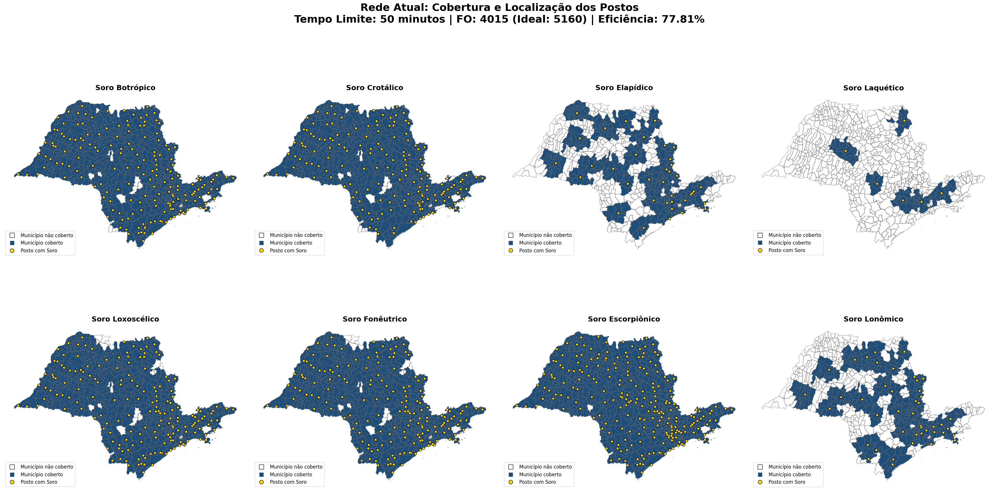

In [ ]:
# 1. Configuração de estilo
cmap = mcolors.ListedColormap(['white','#1f4e79'])
#fig, ax = plt.subplots(4, 2, figsize=(30, 35))
fig, ax = plt.subplots(2, 4, figsize=(35, 20))
ax = ax.flatten()

for k in K:
    coluna = cols_soro[k]

    # 2. Plotar a COBERTURA (Municípios - Polígonos)
    gdf_resultado_atual.plot(
        ax=ax[k],
        column=coluna,
        cmap=cmap,
        vmin=0,
        vmax=1,
        zorder=1
    )

    # Fronteiras cinzas
    gdf_resultado_atual.boundary.plot(
        ax=ax[k],
        color='dimgray',
        linewidth=0.5,
        zorder=2
    )

    # 3. Plotar os POSTOS (Pontos)
    # Filtramos os postos que possuem o soro k
    postos_com_soro_k = gdf_postos[gdf_postos[coluna] == 1]

    if not postos_com_soro_k.empty:
        # Isso força o GeoPandas a ignorar o polígono e desenhar o POINT
        postos_com_soro_k.set_geometry('coords').plot(
            ax=ax[k],
            marker='o',
            color='#ffd700',     # Amarelo
            markersize=40,       # Tamanho do ponto
            edgecolor='black',   # Contorno
            linewidth=1,
            zorder=5             # Camada superior
        )

    # --- Legendas e Títulos (Mantidos) ---
    legenda = [
        Line2D([0], [0], marker='s', color='w', label='Município não coberto',
               markerfacecolor='white', markersize=12, markeredgecolor='black'),
        Line2D([0], [0], marker='s', color='w', label='Município coberto',
               markerfacecolor='#1f4e79', markersize=12),
        Line2D([0], [0], marker='o', color='w', label='Posto com Soro',
               markerfacecolor='#ffd700', markersize=10, markeredgecolor='black')
    ]

    ax[k].legend(handles=legenda, loc='lower left', fontsize=12, frameon=True)
    ax[k].axis('off')
    ax[k].set_title(f'Soro {coluna}', fontsize=18, fontweight='bold')


plt.suptitle(f'Rede Atual: Cobertura e Localização dos Postos\nTempo Limite: 50 minutos | FO: {valor_atual_fo} (Ideal: {valor_ideal_fo}) | Eficiência: {(valor_atual_fo/valor_ideal_fo)*100:.2f}%',
              fontsize = 26, fontweight = "bold")
plt.tight_layout()
plt.savefig("figs/cobertura-atual.png", dpi=300, bbox_inches='tight')
plt.show()

### Demandas - Visualização

In [ ]:
demandas

,Codigo Municipio,Municipio,Casos Loxoscélico Normalizado,Soro Loxoscélico Normalizado,Casos Botrópico Normalizado,Soro Botrópico Normalizado,Casos Crotálico Normalizado,Soro Crotálico Normalizado,Casos Elapídico Normalizado,Soro Elapídico Normalizado,Casos Escorpiônico Normalizado,Soro Escorpiônico Normalizado,Casos Lonômico Normalizado,Soro Lonômico Normalizado,Casos Laquético Normalizado,Soro Laquético Normalizado,Casos Fonêutrico Normalizado,Soro Fonêutrico Normalizado
0,351300,Cotia,0.344828,0.6,0.348837,0.309524,0.2,0.25,0.5,1.0,0.003521,0.026667,0.200000,1.0,1.0,NaN,0.354167,0.166667
1,353282,Nova Campina,0.034483,0.2,0.023256,0.023810,0.2,NaN,NaN,NaN,0.000587,0.013333,NaN,NaN,NaN,NaN,0.020833,NaN
2,350250,Aparecida,0.034483,0.2,0.023256,0.023810,0.2,0.25,NaN,NaN,0.029930,0.053333,NaN,NaN,NaN,NaN,0.020833,NaN
3,354330,Ribeirão Pires,0.068966,0.2,0.139535,0.119048,0.2,NaN,NaN,NaN,0.000587,NaN,0.066667,NaN,NaN,NaN,0.062500,0.166667
4,354200,Quintana,NaN,NaN,0.023256,0.023810,0.2,0.25,0.5,1.0,0.014085,0.013333,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
640,351565,Fernão,NaN,NaN,NaN,NaN,0.2,0.25,NaN,NaN,0.005282,0.013333,NaN,NaN,NaN,NaN,NaN,NaN
641,353760,Peruíbe,0.068966,0.2,0.255814,0.238095,NaN,NaN,NaN,NaN,0.000587,0.013333,0.066667,NaN,NaN,NaN,0.020833,0.166667
642,353630,Patrocínio Paulista,0.034483,0.2,0.046512,0.047619,0.2,0.25,NaN,NaN,0.022300,0.053333,NaN,NaN,NaN,NaN,0.020833,0.166667
643,350120,Álvares Florence,0.034483,0.2,0.046512,0.023810,0.2,0.25,NaN,NaN,0.024061,0.013333,NaN,NaN,NaN,NaN,0.020833,NaN


In [ ]:
demandas_mapa = demandas.fillna(0)
demandas_mapa

,Codigo Municipio,Municipio,Casos Loxoscélico Normalizado,Soro Loxoscélico Normalizado,Casos Botrópico Normalizado,Soro Botrópico Normalizado,Casos Crotálico Normalizado,Soro Crotálico Normalizado,Casos Elapídico Normalizado,Soro Elapídico Normalizado,Casos Escorpiônico Normalizado,Soro Escorpiônico Normalizado,Casos Lonômico Normalizado,Soro Lonômico Normalizado,Casos Laquético Normalizado,Soro Laquético Normalizado,Casos Fonêutrico Normalizado,Soro Fonêutrico Normalizado
0,351300,Cotia,0.344828,0.6,0.348837,0.309524,0.2,0.25,0.5,1.0,0.003521,0.026667,0.200000,1.0,1.0,0.0,0.354167,0.166667
1,353282,Nova Campina,0.034483,0.2,0.023256,0.023810,0.2,0.00,0.0,0.0,0.000587,0.013333,0.000000,0.0,0.0,0.0,0.020833,0.000000
2,350250,Aparecida,0.034483,0.2,0.023256,0.023810,0.2,0.25,0.0,0.0,0.029930,0.053333,0.000000,0.0,0.0,0.0,0.020833,0.000000
3,354330,Ribeirão Pires,0.068966,0.2,0.139535,0.119048,0.2,0.00,0.0,0.0,0.000587,0.000000,0.066667,0.0,0.0,0.0,0.062500,0.166667
4,354200,Quintana,0.000000,0.0,0.023256,0.023810,0.2,0.25,0.5,1.0,0.014085,0.013333,0.000000,0.0,0.0,0.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
640,351565,Fernão,0.000000,0.0,0.000000,0.000000,0.2,0.25,0.0,0.0,0.005282,0.013333,0.000000,0.0,0.0,0.0,0.000000,0.000000
641,353760,Peruíbe,0.068966,0.2,0.255814,0.238095,0.0,0.00,0.0,0.0,0.000587,0.013333,0.066667,0.0,0.0,0.0,0.020833,0.166667
642,353630,Patrocínio Paulista,0.034483,0.2,0.046512,0.047619,0.2,0.25,0.0,0.0,0.022300,0.053333,0.000000,0.0,0.0,0.0,0.020833,0.166667
643,350120,Álvares Florence,0.034483,0.2,0.046512,0.023810,0.2,0.25,0.0,0.0,0.024061,0.013333,0.000000,0.0,0.0,0.0,0.020833,0.000000


In [ ]:
demandas_mapa.columns

Index(['Codigo Municipio', 'Municipio', 'Casos Loxoscélico Normalizado',
       'Soro Loxoscélico Normalizado', 'Casos Botrópico Normalizado',
       'Soro Botrópico Normalizado', 'Casos Crotálico Normalizado',
       'Soro Crotálico Normalizado', 'Casos Elapídico Normalizado',
       'Soro Elapídico Normalizado', 'Casos Escorpiônico Normalizado',
       'Soro Escorpiônico Normalizado', 'Casos Lonômico Normalizado',
       'Soro Lonômico Normalizado', 'Casos Laquético Normalizado',
       'Soro Laquético Normalizado', 'Casos Fonêutrico Normalizado',
       'Soro Fonêutrico Normalizado'],
      dtype='object')

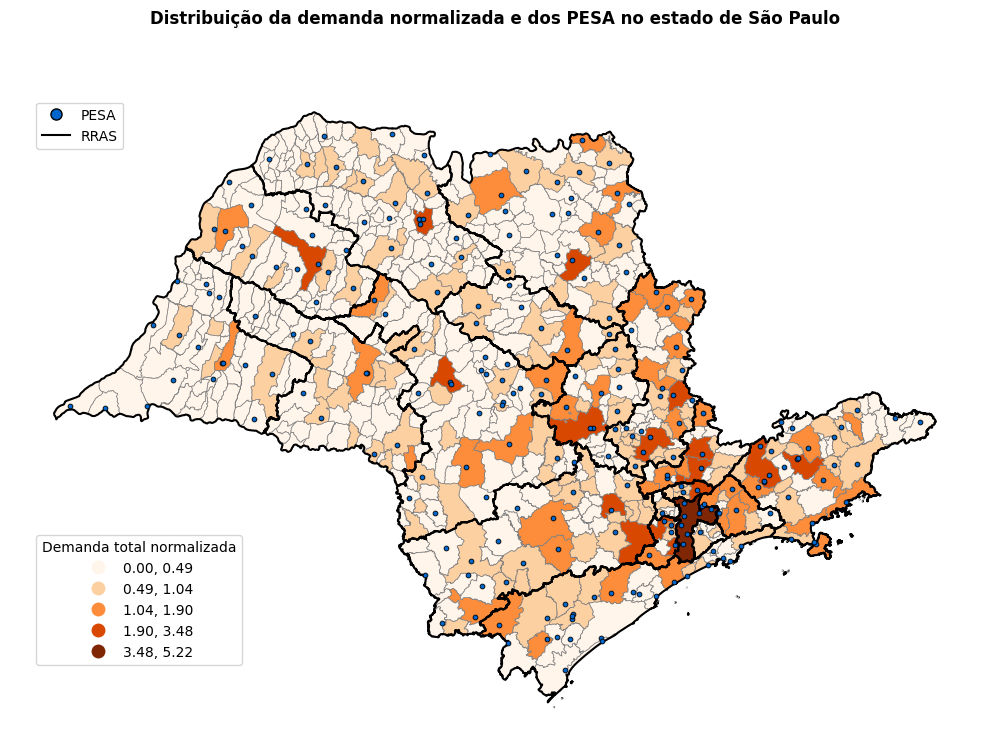

In [ ]:
import mapclassify as mc
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt

# Colunas de demanda normalizada existentes no DataFrame
colunas_demanda_normalizada = [
    'Casos Loxoscélico Normalizado',
    'Casos Botrópico Normalizado',
    'Casos Crotálico Normalizado',
    'Casos Elapídico Normalizado',
    'Casos Escorpiônico Normalizado',
    'Casos Lonômico Normalizado',
    'Casos Laquético Normalizado',
    'Casos Fonêutrico Normalizado'
]

# Soma dos índices normalizados de demanda dos oito soros
demandas['Demanda Total Normalizada'] = (
    demandas[colunas_demanda_normalizada]
    .fillna(0)
    .sum(axis=1)
)

# GeoDataFrame dos municípios
gdf_demanda = gdf_munic[
    ['Codigo Municipio', 'Municipio', 'geometry']
].copy()

# Junta a demanda ao mapa
gdf_demanda = gdf_demanda.merge(
    demandas[['Codigo Municipio', 'Demanda Total Normalizada']],
    on='Codigo Municipio',
    how='left'
)

# Municípios sem registros recebem demanda zero
gdf_demanda['Demanda Total Normalizada'] = (
    gdf_demanda['Demanda Total Normalizada']
    .fillna(0)
)

# Separa municípios com e sem demanda
gdf_sem_demanda = gdf_demanda[
    gdf_demanda['Demanda Total Normalizada'] == 0
]

gdf_com_demanda = gdf_demanda[
    gdf_demanda['Demanda Total Normalizada'] > 0
]

# Número de faixas, limitado pela quantidade de valores distintos
# Só calcula n_classes se houver demanda para evitar erro em nunique() em GeoDataFrame vazio
if not gdf_com_demanda.empty:
    n_classes = min(5, gdf_com_demanda['Demanda Total Normalizada'].nunique())
else:
    n_classes = 1 # Define um valor padrão se não houver municípios com demanda

# =========================
# PLOT
# =========================

fig, ax = plt.subplots(figsize=(10, 8))

# Municípios sem demanda: cinza-claro
if not gdf_sem_demanda.empty:
    gdf_sem_demanda.plot(
        ax=ax,
        color='#e6e6e6',
        edgecolor='gray',
        linewidth=0.5,
        zorder=1
    )

# Municípios com demanda: escala laranja
if not gdf_com_demanda.empty:
    gdf_com_demanda.plot(
        ax=ax,
        column='Demanda Total Normalizada',
        legend=True,
        k=n_classes,
        scheme='naturalbreaks',
        cmap='Oranges',
        edgecolor='gray',
        linewidth=0.5,
        zorder=2,
        legend_kwds={
            'title': 'Demanda total normalizada',
            'ncols': 1,
            'loc': 'lower left'
        }
    )

# Guarda a legenda automática da demanda
legenda_demanda = ax.get_legend()

# Limites das macrorregiões / RRAS
limites_Macro.boundary.plot(
    ax=ax,
    color='black',
    linewidth=1.5,
    zorder=3
)

# =========================
# PONTOS PESA
# =========================

postos_com_soro = gdf_postos[
    gdf_postos['Tem Soro'] == 1
].copy()

# Plota os PESA apenas se houver postos com soro
if not postos_com_soro.empty:
    postos_com_soro.set_geometry('coords').plot(
        ax=ax,
        marker='o',
        color='#0066CC',
        markersize=12,
        edgecolor='black',
        linewidth=0.6,
        zorder=5
    )

# =========================
# LEGENDAS
# =========================

legenda_adicional = [
    # Line2D(
    #     [0], [0],
    #     marker='s',
    #     color='w',
    #     label='Sem demanda registrada',
    #     markerfacecolor='#e6e6e6',
    #     markeredgecolor='gray',
    #     markersize=9
    # ),
    Line2D(
        [0], [0],
        marker='o',
        color='w',
        label='PESA',
        markerfacecolor='#0066CC',
        markeredgecolor='black',
        markersize=8
    ),
    Line2D(
        [0], [0],
        linestyle='-',
        color='black',
        linewidth=1.5,
        label='RRAS'
    )
]

# Mantém a legenda da escala laranja
if legenda_demanda is not None:
    legenda_demanda.set_bbox_to_anchor((0.02, 0.10))
    ax.add_artist(legenda_demanda)

# Legenda dos elementos do mapa
ax.legend(
    handles=legenda_adicional,
    loc='upper left',
    bbox_to_anchor=(0.02, 0.98),
    frameon=True
)

ax.axis('off')

plt.suptitle(
    'Distribuição da demanda normalizada e dos PESA no estado de São Paulo',
    fontsize=12,
    fontweight='bold'
)

plt.tight_layout()

plt.savefig(
    'figs/demanda-normalizada-pesa.png',
    dpi=300,
    bbox_inches='tight'
)

plt.show()

# Modelos corrigidos: cobertura atual, cobertura total mínima e máxima cobertura por demanda

Este bloco usa somente os PESA que já existem como locais candidatos. Assim, ``mover um soro`` significa alterar em qual PESA ativo aquele tipo de soro fica disponível; ele não cria uma unidade nova. A matriz de tempos deve ter linhas na mesma ordem de ``gdf_munic`` e colunas na mesma ordem original de ``gdf_postos``.

Os três cenários são independentes para cada soro:

1. **Rede atual**: mede a cobertura da configuração observada.
2. **Cobertura total mínima (Set Covering)**: encontra o menor número de PESA que precisariam oferecer aquele soro para cobrir todos os municípios em até 50 min, se isso for viável com os PESA candidatos.
3. **Máxima cobertura ponderada (MCLP)**: mantém exatamente a quantidade atual de postos que oferecem cada soro e os realoca para maximizar a demanda coberta.

Em todos os casos, distância/tempo igual a zero é válido: o município do próprio PESA deve estar coberto.


In [ ]:
# Parametros da licença de estudante - Gurobi
# env_parametros = {
#     "WLSACCESSID": '8775f90b-b918-46ba-951a-37d9ac5e94d0',
#     "WLSSECRET": '4949ac76-0335-47c4-9250-e6aaec150917',
#     "LICENSEID": 2793494
# }

# Julia G.
env_parametros = {
  "WLSACCESSID" : '45002249-b310-4ffd-8b53-a06478924931',
  "WLSSECRET" : '2ecf9a85-a74a-47ca-bf3e-8f70b5ed3df3',
  "LICENSEID" : 2721627
}

In [ ]:
# ===================== PREPARAÇÃO E VALIDAÇÃO =====================
from gurobipy import Model, GRB, quicksum

TIPOS_SORO = [
    'Botrópico', 'Crotálico', 'Elapídico', 'Laquético',
    'Loxoscélico', 'Fonêutrico', 'Escorpiônico', 'Lonômico'
]
TEMPO_MAXIMO = 50 * 60  # segundos

# Locais candidatos: PESA já ativos. Para permitir novos municípios candidatos,
# substitua este filtro pelo conjunto de unidades elegíveis.
postos_candidatos = gdf_postos.loc[gdf_postos['Tem Soro'].eq(1)].copy()
indices_candidatos = postos_candidatos.index.to_list()

assert Distancias.shape[0] == len(gdf_munic), 'Linhas de Distancias e gdf_munic não estão alinhadas.'
assert Distancias.shape[1] == len(gdf_postos), 'Colunas de Distancias e gdf_postos não estão alinhadas.'

municipios = list(range(len(gdf_munic)))
postos = list(range(len(postos_candidatos)))
tempos = Distancias[:, indices_candidatos]

# a[m,p] = 1 quando o PESA p alcança o município m dentro do limite.
a = (tempos <= TEMPO_MAXIMO).astype(int)
N = {m: [p for p in postos if a[m, p] == 1] for m in municipios}

# Demanda: casos médios/anuais por município e por soro. Prefira casos brutos;
# a versão normalizada só é usada se a coluna bruta não existir.
demandas_modelo = pd.read_csv('dados/DemandasMunicipais_CNMAC.csv')
demandas_modelo = demandas_modelo.set_index('Codigo Municipio').reindex(gdf_munic['Codigo Municipio']).fillna(0)

# colunas_demanda = {}
# for soro in TIPOS_SORO:
#     bruta = f'Casos {soro}'
#     normalizada = f'Casos {soro} Normalizado'
#     if bruta in demandas_modelo.columns:
#         colunas_demanda[soro] = bruta
#     elif normalizada in demandas_modelo.columns:
#         colunas_demanda[soro] = normalizada
#         print(f'Atenção: {bruta} não encontrada; usando {normalizada}.')
#     else:
#         raise KeyError(f'Não encontrei uma coluna de demanda para {soro}.')

# Usa demanda normalizada para todos os soros
colunas_demanda = {
    soro: f'Casos {soro} Normalizado'
    for soro in TIPOS_SORO
}

# Verificação: garante que todas as colunas existem no DataFrame
colunas_ausentes = [
    coluna for coluna in colunas_demanda.values()
    if coluna not in demandas_modelo.columns
]

if colunas_ausentes:
    raise KeyError(
        f'As seguintes colunas normalizadas não foram encontradas: {colunas_ausentes}'
    )

w = {(m, k): float(demandas_modelo.iloc[m][colunas_demanda[soro]])
     for m in municipios for k, soro in enumerate(TIPOS_SORO)}
estoque_atual = {k: int(postos_candidatos[soro].fillna(0).sum())
                  for k, soro in enumerate(TIPOS_SORO)}

print(f'Municípios: {len(municipios)} | PESA candidatos: {len(postos)}')
print('PESA por soro:', dict(zip(TIPOS_SORO, estoque_atual.values())))


Municípios: 645 | PESA candidatos: 242
PESA por soro: {'Botrópico': 185, 'Crotálico': 169, 'Elapídico': 40, 'Laquético': 6, 'Loxoscélico': 182, 'Fonêutrico': 182, 'Escorpiônico': 239, 'Lonômico': 46}


In [ ]:
# w

In [ ]:
# ===================== 1. COBERTURA DA REDE ATUAL =====================
linhas_atual = []
for k, soro in enumerate(TIPOS_SORO):
    postos_com_soro = [p for p in postos if postos_candidatos.iloc[p][soro] == 1]
    coberto = np.array([any(a[m, p] for p in postos_com_soro) for m in municipios], dtype=int)
    demanda_total = sum(w[m, k] for m in municipios)
    demanda_coberta = sum(w[m, k] * coberto[m] for m in municipios)
    linhas_atual.append({
        'Soro': soro, 'Postos atuais': len(postos_com_soro),
        'Municípios cobertos': int(coberto.sum()),
        'Cobertura por municípios (%)': 100 * coberto.mean(),
        'Demanda coberta': demanda_coberta, 'Demanda total': demanda_total,
        'Cobertura por demanda (%)': 100 * demanda_coberta / demanda_total if demanda_total else np.nan
    })

df_rede_atual = pd.DataFrame(linhas_atual).round(2)
display(df_rede_atual)


,Soro,Postos atuais,Municípios cobertos,Cobertura por municípios (%),Demanda coberta,Demanda total,Cobertura por demanda (%)
0,Botrópico,185,630,97.67,36.40,37.05,98.24
1,Crotálico,169,627,97.21,106.80,109.60,97.45
2,Elapídico,40,392,60.78,47.00,67.50,69.63
3,Laquético,6,99,15.35,5.00,14.00,35.71
4,Loxoscélico,182,623,96.59,29.48,30.10,97.94
5,Fonêutrico,182,623,96.59,23.92,24.44,97.87
6,Escorpiônico,239,642,99.53,24.51,24.52,99.95
7,Lonômico,46,379,58.76,15.67,19.27,81.31


In [ ]:
# ===================== 2. COBERTURA TOTAL COM MÍNIMO DE POSTOS =====================
# Resolve um Set Covering para CADA soro. Como o limite é igual para todos,
# o conjunto mínimo pode coincidir; a tabela mede "disponibilizações soro-posto",
# não necessariamente PESA físicos distintos entre os soros.
linhas_minimo = []
selecionados_minimo = {}

for k, soro in enumerate(TIPOS_SORO):
    sem_candidato = [m for m in municipios if not N[m]]
    if sem_candidato:
        linhas_minimo.append({'Soro': soro, 'Viável?': 'Não',
                               'Postos mínimos para 100%': np.nan,
                               'Municípios sem candidato no raio': len(sem_candidato)})
        continue

    sc = Model(f'SetCover_{soro}')
    sc.Params.OutputFlag = 0
    z = sc.addVars(postos, vtype=GRB.BINARY, name='z')
    sc.setObjective(quicksum(z[p] for p in postos), GRB.MINIMIZE)
    for m in municipios:
        sc.addConstr(quicksum(z[p] for p in N[m]) >= 1, name=f'cobre_{m}')
    sc.optimize()

    if sc.Status == GRB.OPTIMAL:
        selecionados_minimo[soro] = [p for p in postos if z[p].X > 0.5]
        linhas_minimo.append({'Soro': soro, 'Viável?': 'Sim',
                               'Postos mínimos para 100%': len(selecionados_minimo[soro]),
                               'Municípios sem candidato no raio': 0})
    else:
        linhas_minimo.append({'Soro': soro, 'Viável?': 'Não',
                               'Postos mínimos para 100%': np.nan,
                               'Municípios sem candidato no raio': 0})

df_minimo_100 = pd.DataFrame(linhas_minimo)
display(df_minimo_100)


,Soro,Viável?,Postos mínimos para 100%,Municípios sem candidato no raio
0,Botrópico,Não,NaN,3
1,Crotálico,Não,NaN,3
2,Elapídico,Não,NaN,3
3,Laquético,Não,NaN,3
4,Loxoscélico,Não,NaN,3
5,Fonêutrico,Não,NaN,3
6,Escorpiônico,Não,NaN,3
7,Lonômico,Não,NaN,3


In [ ]:
# ===================== 3. MÁXIMA COBERTURA PONDERADA: REALOCAR SOROS =====================
# x[p,k] = 1 se o PESA candidato p passa a disponibilizar o soro k.
# y[m,k] = 1 se o município m fica coberto para o soro k.
# A igualdade abaixo preserva a quantidade atual de PESA por soro.
env = Env(params=env_parametros)
mclp = Model('MCLP_realocacao_soros', env=env)
mclp.Params.OutputFlag = 1
x_mclp = mclp.addVars(postos, range(len(TIPOS_SORO)), vtype=GRB.BINARY, name='x')
y_mclp = mclp.addVars(municipios, range(len(TIPOS_SORO)), vtype=GRB.BINARY, name='y')

mclp.setObjective(quicksum(w[m, k] * y_mclp[m, k]
                           for m in municipios for k in range(len(TIPOS_SORO))), GRB.MAXIMIZE)

for k in range(len(TIPOS_SORO)):
    mclp.addConstr(quicksum(x_mclp[p, k] for p in postos) == estoque_atual[k],
                   name=f'mantem_estoque_{k}')
    for m in municipios:
        # y só pode assumir 1 se algum posto com o soro alcança m.
        mclp.addConstr(y_mclp[m, k] <= quicksum(a[m, p] * x_mclp[p, k] for p in postos),
                       name=f'cobertura_{m}_{k}')

mclp.optimize()
assert mclp.Status == GRB.OPTIMAL, 'MCLP não encontrou solução ótima.'


Set parameter WLSAccessID
Set parameter WLSSecret
Set parameter LicenseID to value 2721627
Academic license 2721627 - for non-commercial use only - registered to ju___@usp.br
Set parameter OutputFlag to value 1
Gurobi Optimizer version 13.0.3 build v13.0.3rc0 (linux64 - "Ubuntu 24.04.4 LTS")

CPU model: Intel(R) Xeon(R) CPU @ 2.20GHz, instruction set [SSE2|AVX|AVX2]
Thread count: 1 physical cores, 2 logical processors, using up to 2 threads

Academic license 2721627 - for non-commercial use only - registered to ju___@usp.br
Optimize a model with 5168 rows, 7096 columns and 32688 nonzeros (Max)
Model fingerprint: 0xeeee6c11
Model has 2908 linear objective coefficients
Variable types: 0 continuous, 7096 integer (7096 binary)
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [6e-04, 1e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [6e+00, 2e+02]

Found heuristic solution: objective 267.4066072
Presolve removed 4716 rows and 6408 columns
Presolve time:

In [ ]:
# ===================== RESULTADOS: MUNICÍPIOS E DEMANDA =====================

linhas_mclp = []
alocacao_otimizada = postos_candidatos.copy()
solucoes_mclp = []

for k, soro in enumerate(TIPOS_SORO):

    # Indicadores da rede antes da realocação
    atual = df_rede_atual.loc[
        df_rede_atual['Soro'].eq(soro)
    ].iloc[0]

    # Solução do modelo
    x_sol = np.array(
        [int(x_mclp[p, k].X > 0.5) for p in postos],
        dtype=int
    )

    y_sol = np.array(
        [int(y_mclp[m, k].X > 0.5) for m in municipios],
        dtype=int
    )

    # Cobertura física REcalculada usando exclusivamente os postos
    # que ficaram com o soro na solução final.
    #
    # a[m, p] = 1 quando o posto p alcança o município m em até 50 min.
    cobertura_fisica = (a @ x_sol > 0).astype(int)

    # Verificação: o modelo nunca pode declarar um município coberto
    # sem que exista um posto selecionado capaz de atendê-lo.
    assert np.all(y_sol <= cobertura_fisica), (
        f'Inconsistência de cobertura encontrada para o soro {soro}.'
    )

    # Salva as soluções para mapas e análises posteriores.
    # "y" recebe a cobertura física, não apenas a variável auxiliar do modelo.
    solucoes_mclp.append({
        'x': x_sol,
        'y': cobertura_fisica,
        'y_modelo': y_sol
    })

    # Alocação final dos soros nos PESA
    alocacao_otimizada[soro] = x_sol

    # Demanda e cobertura obtidas pela configuração física final
    demanda_total = sum(w[m, k] for m in municipios)

    demanda_coberta = sum(
        w[m, k] * cobertura_fisica[m]
        for m in municipios
    )

    # Comparação da distribuição antes e depois
    original = postos_candidatos[soro].fillna(0).to_numpy(dtype=int)

    linhas_mclp.append({
        'Soro': soro,
        'Postos mantidos': int(x_sol.sum()),
        'Soros realocados': int(((original == 0) & (x_sol == 1)).sum()),

        'Municípios cobertos - atual': int(atual['Municípios cobertos']),
        'Municípios cobertos - otimizado': int(cobertura_fisica.sum()),

        'Cobertura atual por municípios (%)':
            atual['Cobertura por municípios (%)'],

        'Cobertura otimizada por municípios (%)':
            100 * cobertura_fisica.mean(),

        'Cobertura atual por demanda (%)':
            atual['Cobertura por demanda (%)'],

        'Cobertura otimizada por demanda (%)':
            100 * demanda_coberta / demanda_total if demanda_total else np.nan,

        'Demanda adicional coberta':
            demanda_coberta - atual['Demanda coberta']
    })

df_comparacao_modelos = pd.DataFrame(linhas_mclp).round(2)
display(df_comparacao_modelos)

# Arquivos para auditoria e mapas posteriores
alocacao_otimizada.to_csv(
    'postos_soros_realocados_mclp.csv',
    index=False,
    encoding='utf-8-sig'
)

df_rede_atual.to_csv(
    'cobertura_rede_atual.csv',
    index=False,
    encoding='utf-8-sig'
)

df_minimo_100.to_csv(
    'postos_minimos_cobertura_total.csv',
    index=False,
    encoding='utf-8-sig'
)

df_comparacao_modelos.to_csv(
    'comparacao_cobertura_municipios_demanda.csv',
    index=False,
    encoding='utf-8-sig'
)

,Soro,Postos mantidos,Soros realocados,Municípios cobertos - atual,Municípios cobertos - otimizado,Cobertura atual por municípios (%),Cobertura otimizada por municípios (%),Cobertura atual por demanda (%),Cobertura otimizada por demanda (%),Demanda adicional coberta
0,Botrópico,185,37,630,641,97.67,99.38,98.24,99.56,0.48
1,Crotálico,169,48,627,640,97.21,99.22,97.45,99.45,2.20
2,Elapídico,40,32,392,459,60.78,71.16,69.63,100.00,20.50
3,Laquético,6,6,99,108,15.35,16.74,35.71,71.43,5.00
4,Loxoscélico,182,39,623,642,96.59,99.53,97.94,99.66,0.52
5,Fonêutrico,182,41,623,639,96.59,99.07,97.87,99.40,0.37
6,Escorpiônico,239,3,642,642,99.53,99.53,99.95,99.95,0.00
7,Lonômico,46,33,379,495,58.76,76.74,81.31,99.31,3.46


In [ ]:
# df_comparacao_modelos.to_latex()

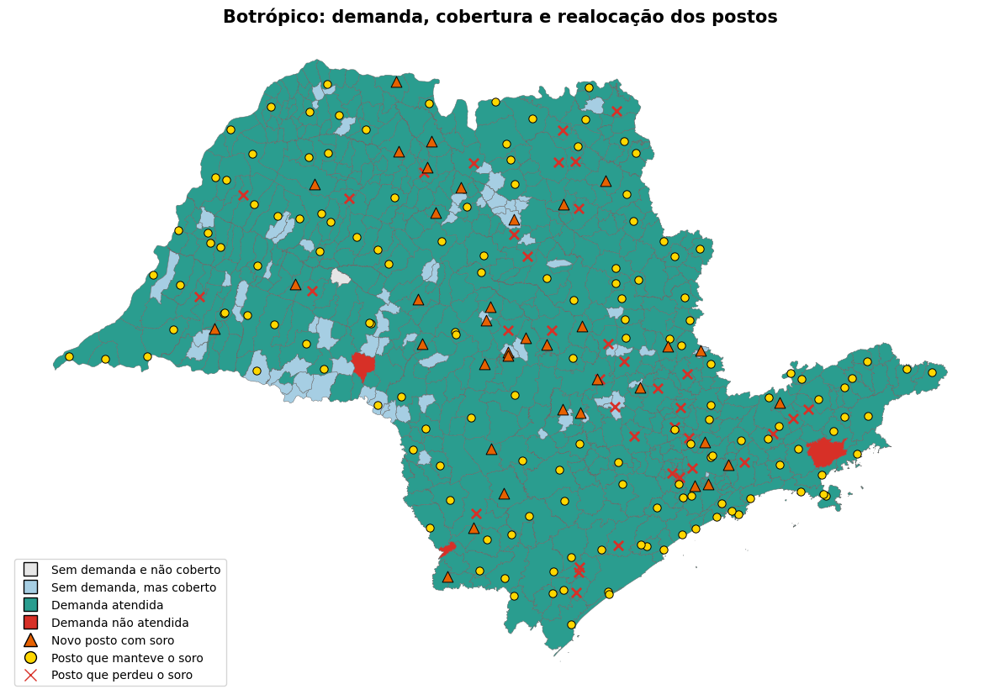

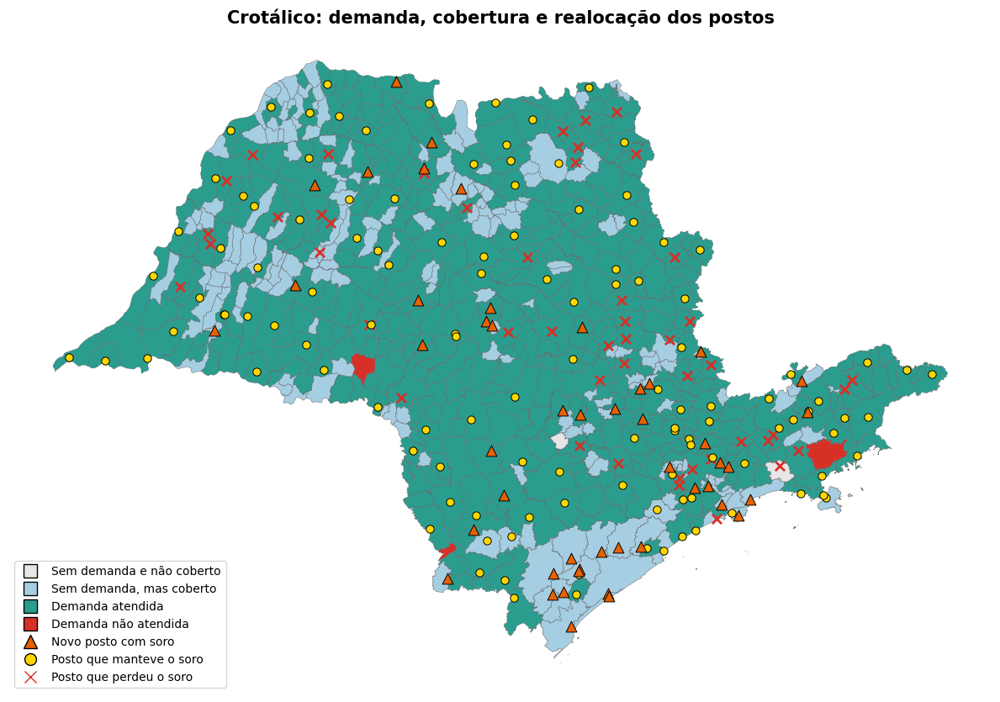

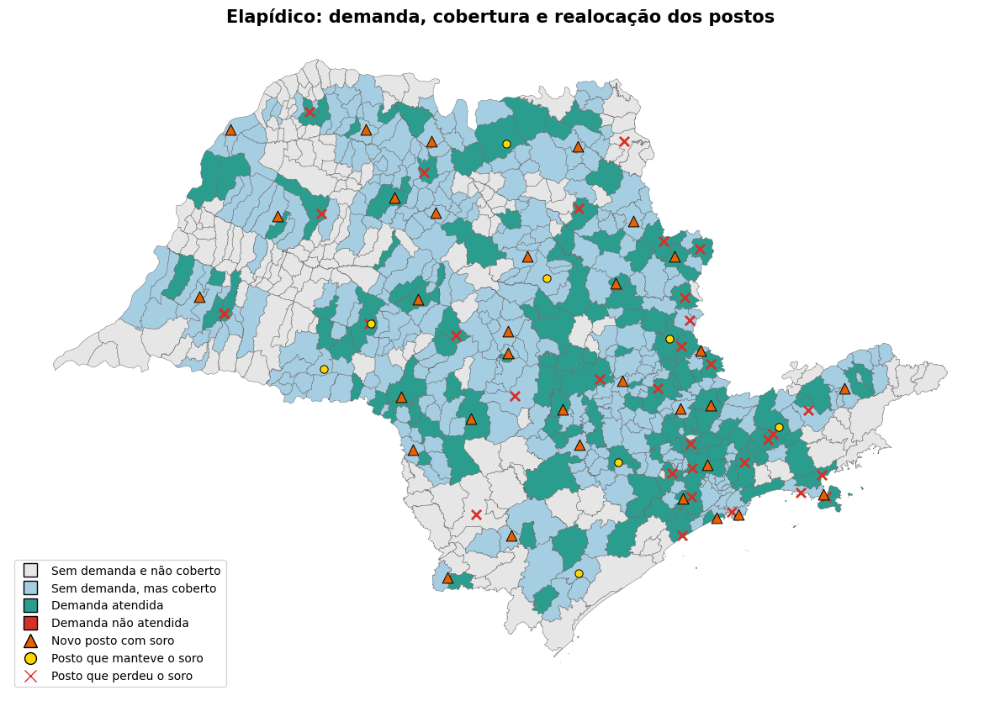

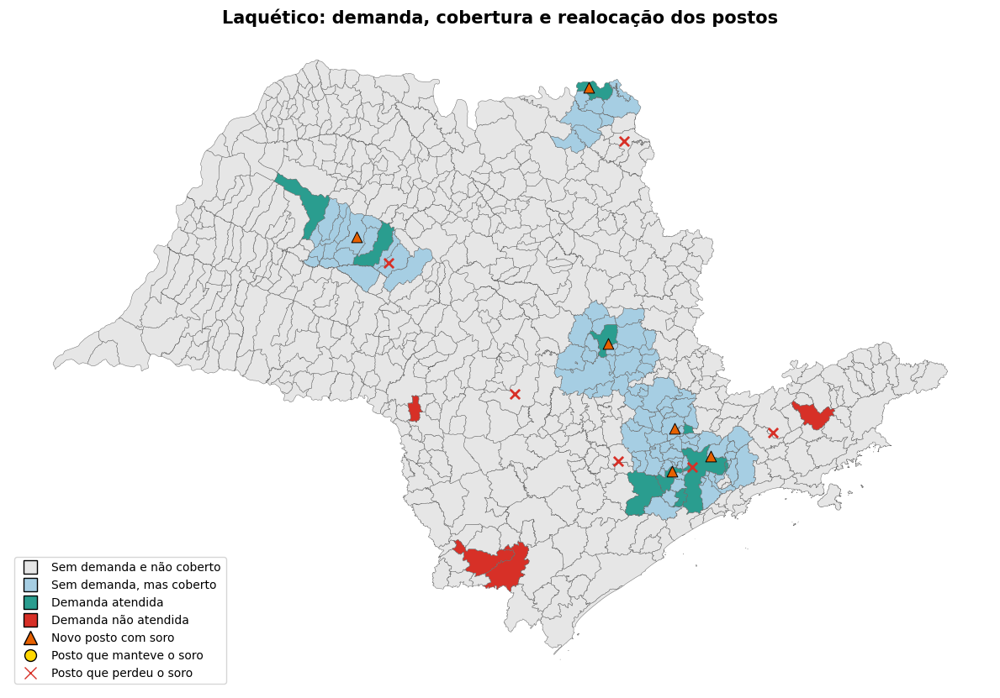

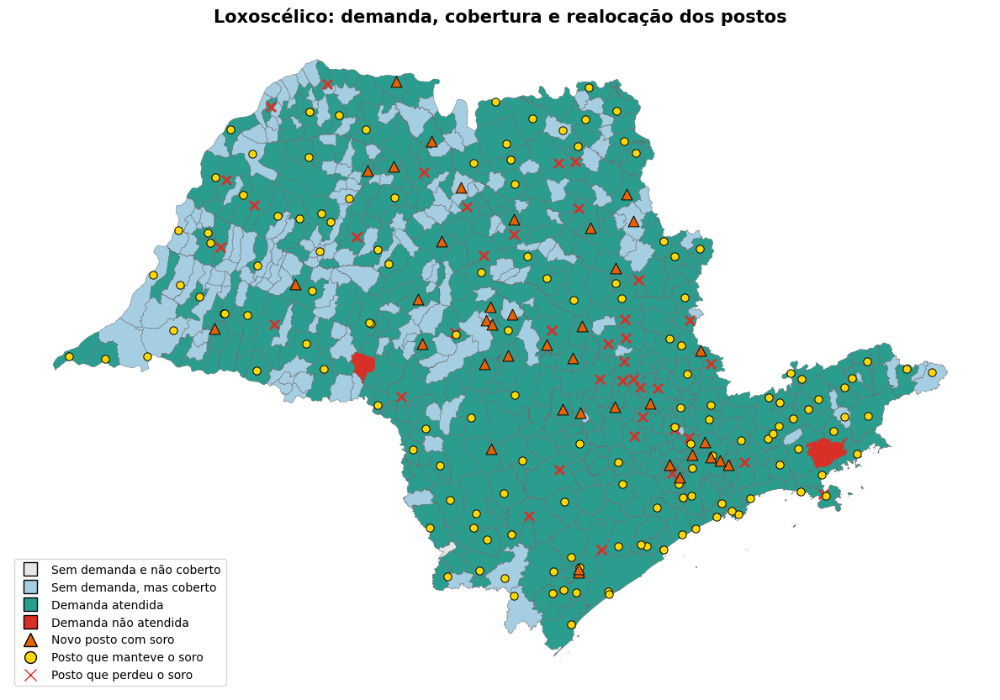

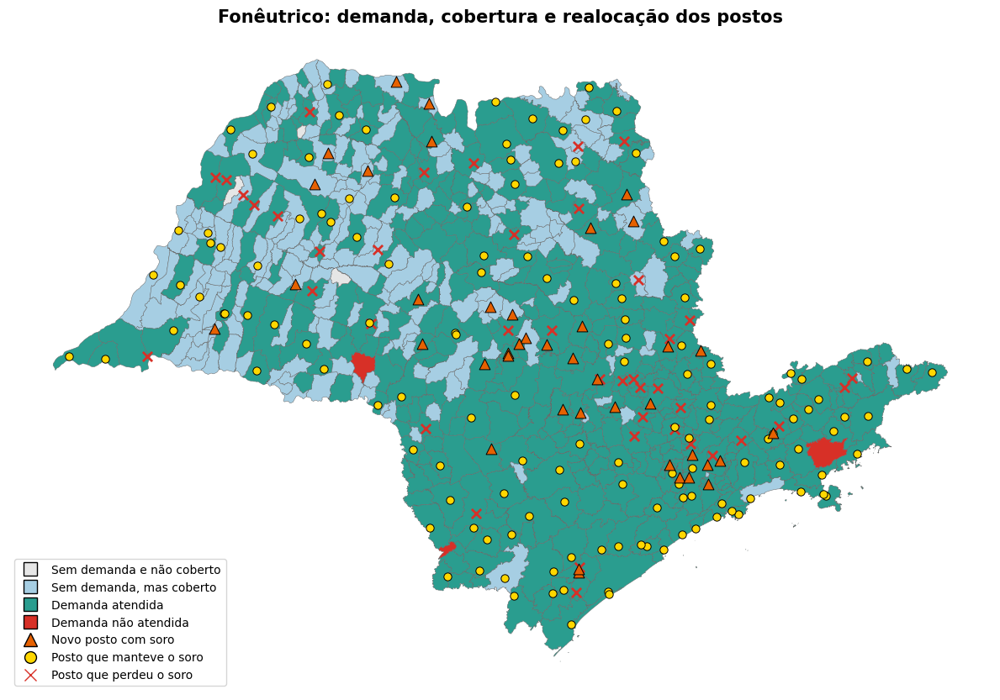

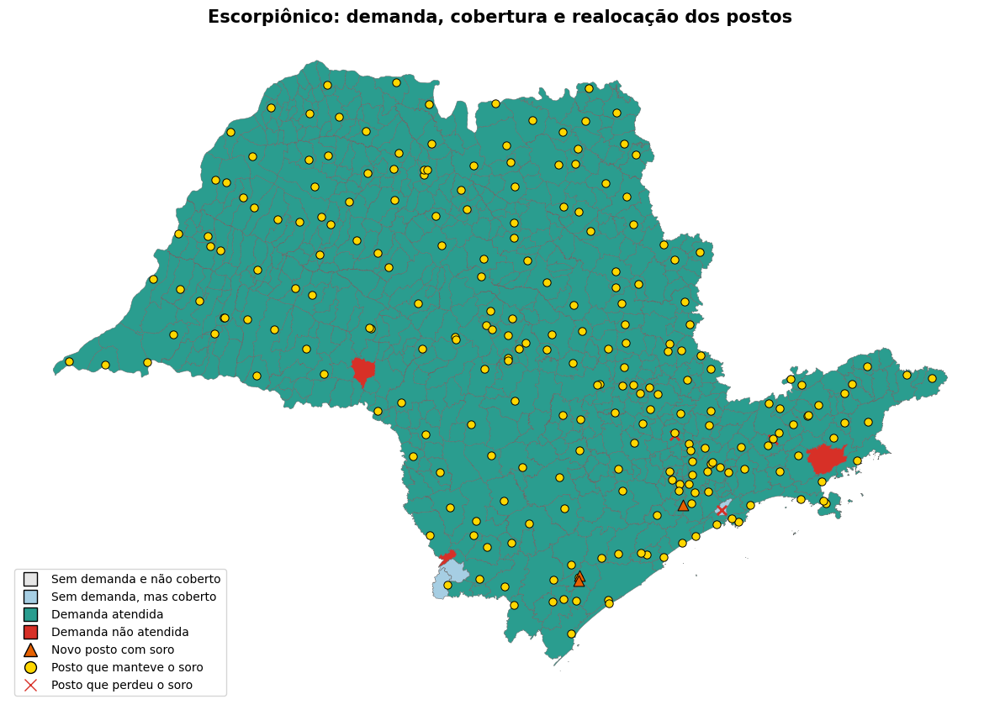

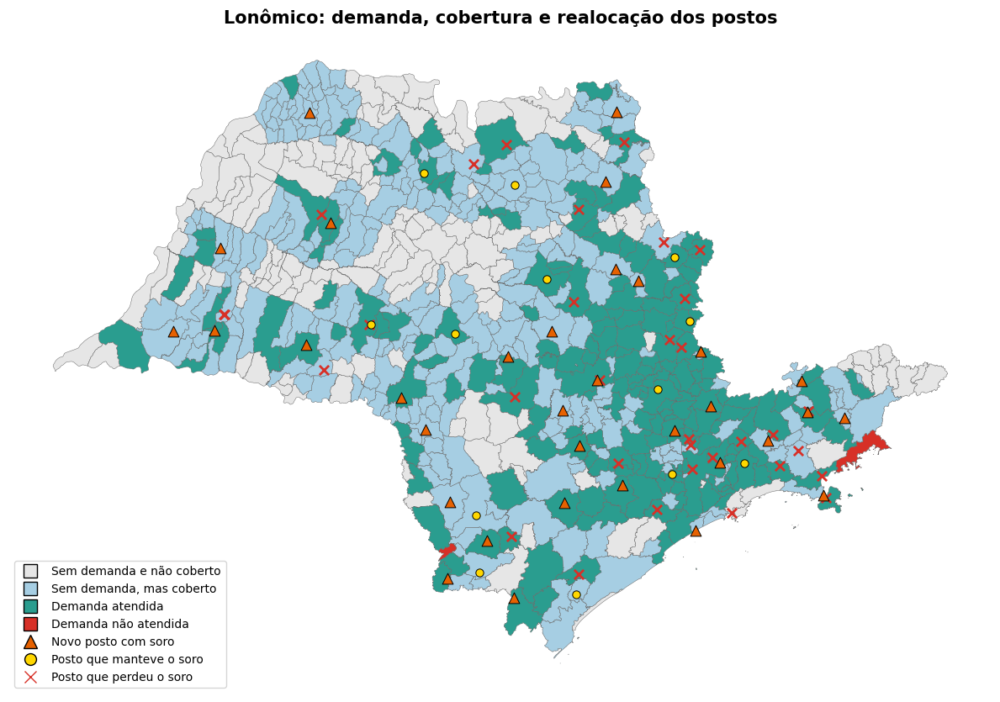

In [ ]:
from matplotlib.lines import Line2D
import geopandas as gpd
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import numpy as np

# GeoDataFrame dos PESA candidatos
postos_mapa = gpd.GeoDataFrame(
    postos_candidatos.copy(),
    geometry='coords',
    crs='EPSG:4326'
)

# Mesmo sistema de coordenadas dos municípios
if postos_mapa.crs != gdf_munic.crs:
    postos_mapa = postos_mapa.to_crs(gdf_munic.crs)

# Classes dos municípios:
# 0 = sem demanda e não coberto
# 1 = sem demanda, mas coberto
# 2 = demanda atendida
# 3 = demanda não atendida
cmap_demanda_cobertura = mcolors.ListedColormap([
    '#e6e6e6',  # cinza
    '#a6cee3',  # azul-claro
    '#2a9d8f',  # verde
    '#d73027'   # vermelho
])

for k, soro in enumerate(TIPOS_SORO):

    # Município, demanda e cobertura na solução otimizada
    municipios_mapa = gdf_munic.copy()
    municipios_mapa['Coberto'] = solucoes_mclp[k]['y']

    # Mesma demanda empregada no modelo de otimização
    municipios_mapa['Demanda'] = demandas_modelo[
        colunas_demanda[soro]
    ].to_numpy()

    # Classificação visual dos municípios
    municipios_mapa['Classe'] = np.select(
        [
            # Não há demanda, mas o município está dentro da cobertura
            (municipios_mapa['Demanda'] == 0) & (municipios_mapa['Coberto'] == 1),

            # Há demanda e ela é atendida
            (municipios_mapa['Demanda'] > 0) & (municipios_mapa['Coberto'] == 1),

            # Há demanda, mas o município não está coberto
            (municipios_mapa['Demanda'] > 0) & (municipios_mapa['Coberto'] == 0),
        ],
        [
            1,  # sem demanda, mas coberto
            2,  # demanda atendida
            3,  # demanda não atendida
        ],
        default=0  # sem demanda e não coberto
    )

    # Situação atual e otimizada do soro em cada PESA
    atual = postos_candidatos[soro].fillna(0).astype(int).to_numpy()
    otimizado = solucoes_mclp[k]['x']

    postos_mapa_soro = postos_mapa.copy()
    postos_mapa_soro['Status'] = np.select(
        [
            (atual == 0) & (otimizado == 1),
            (atual == 1) & (otimizado == 1),
            (atual == 1) & (otimizado == 0),
        ],
        [
            'Novo posto',
            'Manteve o soro',
            'Soro realocado'
        ],
        default='Sem soro'
    )

    fig, ax = plt.subplots(figsize=(12, 12))

    # Municípios: demanda e cobertura
    municipios_mapa.plot(
        ax=ax,
        column='Classe',
        cmap=cmap_demanda_cobertura,
        vmin=0,
        vmax=3,
        edgecolor='dimgray',
        linewidth=0.35,
        zorder=1
    )

    # Postos que perderam o soro
    postos_perderam = postos_mapa_soro[
        postos_mapa_soro['Status'] == 'Soro realocado'
    ]

    if not postos_perderam.empty:
        postos_perderam.plot(
            ax=ax,
            color='#d73027',
            marker='x',
            markersize=65,
            linewidth=2,
            zorder=4
        )

    # Postos que mantiveram o soro
    postos_mantiveram = postos_mapa_soro[
        postos_mapa_soro['Status'] == 'Manteve o soro'
    ]

    if not postos_mantiveram.empty:
        postos_mantiveram.plot(
            ax=ax,
            color='#ffd700',
            marker='o',
            markersize=45,
            edgecolor='black',
            linewidth=0.7,
            zorder=5
        )

    # Novos postos com o soro
    postos_novos = postos_mapa_soro[
        postos_mapa_soro['Status'] == 'Novo posto'
    ]

    if not postos_novos.empty:
        postos_novos.plot(
            ax=ax,
            color='#e66101',
            marker='^',
            markersize=85,
            edgecolor='black',
            linewidth=0.7,
            zorder=6
        )

    legenda = [
        Line2D(
            [0], [0], marker='s', color='w',
            label='Sem demanda e não coberto',
            markerfacecolor='#e6e6e6',
            markeredgecolor='black',
            markersize=12
        ),
        Line2D(
            [0], [0], marker='s', color='w',
            label='Sem demanda, mas coberto',
            markerfacecolor='#a6cee3',
            markeredgecolor='black',
            markersize=12
        ),
        Line2D(
            [0], [0], marker='s', color='w',
            label='Demanda atendida',
            markerfacecolor='#2a9d8f',
            markeredgecolor='black',
            markersize=12
        ),
        Line2D(
            [0], [0], marker='s', color='w',
            label='Demanda não atendida',
            markerfacecolor='#d73027',
            markeredgecolor='black',
            markersize=12
        ),
        Line2D(
            [0], [0], marker='^', color='w',
            label='Novo posto com soro',
            markerfacecolor='#e66101',
            markeredgecolor='black',
            markersize=11
        ),
        Line2D(
            [0], [0], marker='o', color='w',
            label='Posto que manteve o soro',
            markerfacecolor='#ffd700',
            markeredgecolor='black',
            markersize=10
        ),
        Line2D(
            [0], [0], marker='x', color='#d73027',
            label='Posto que perdeu o soro',
            markersize=10,
            linewidth=0
        ),
    ]

    ax.legend(
        handles=legenda,
        loc='lower left',
        fontsize=10,
        frameon=True
    )

    ax.set_title(
        f'{soro}: demanda, cobertura e realocação dos postos',
        fontsize=15,
        fontweight='bold'
    )

    ax.axis('off')

    plt.tight_layout()

    plt.savefig(
        f'mapa_demanda_{soro.lower()}.png',
        dpi=300,
        bbox_inches='tight'
    )

    plt.show()

In [ ]:
novos_postos = []

for k, soro in enumerate(TIPOS_SORO):
    atual = postos_candidatos[soro].fillna(0).astype(int).to_numpy()
    otimizado = solucoes_mclp[k]['x']

    novos = postos_candidatos.loc[
        (atual == 0) & (otimizado == 1),
        ['Nome Posto', 'Municipio', 'Codigo Municipio']
    ].copy()

    novos['Soro adicionado'] = soro
    novos_postos.append(novos)

df_novos_postos = pd.concat(novos_postos, ignore_index=True)
display(df_novos_postos)

,Nome Posto,Municipio,Codigo Municipio,Soro adicionado
0,HOSPITAL SÃO CAMILO - ÁGUAS DE LINDÓIA,Águas de Lindóia,350050,Botrópico
1,IRMANDADE DA SANTA CASA DE MISERICORDIA DE BARIRI,Bariri,350520,Botrópico
2,HOSPITAL E MATERNIDADE SAO JOSE BARRA BONITA,Barra Bonita,350530,Botrópico
3,UPA - BATATAIS,Batatais,350590,Botrópico
4,PRONTO ATENDIMENTO MUNICIPAL DE BORACEIA,Boracéia,350730,Botrópico
...,...,...,...,...
234,HOSPITAL DE SÃO MIGUEL ARCANJO,São Miguel Arcanjo,355020,Lonômico
235,HOSPITAL MUNICIPAL TIDE SETÚBAL,São Paulo,355030,Lonômico
236,PRONTO SOCORRO CENTRAL - SAO SEBASTIAO,São Sebastião,355070,Lonômico
237,UPA DE TATUÍ,Tatuí,355400,Lonômico


In [ ]:
total_realocacoes = df_comparacao_modelos['Soros realocados'].sum()

print(f'Total de realocações de soros necessárias: {total_realocacoes}')

Total de realocações de soros necessárias: 239


In [ ]:
matriz_atual = postos_candidatos[TIPOS_SORO].fillna(0).astype(int)
matriz_otimizada = alocacao_otimizada[TIPOS_SORO].fillna(0).astype(int)

mudou = matriz_atual.ne(matriz_otimizada)

postos_que_recebem = postos_candidatos.loc[
    ((matriz_atual == 0) & (matriz_otimizada == 1)).any(axis=1),
    ['Nome Posto', 'Municipio']
]

postos_que_perdem = postos_candidatos.loc[
    ((matriz_atual == 1) & (matriz_otimizada == 0)).any(axis=1),
    ['Nome Posto', 'Municipio']
]

postos_afetados = postos_candidatos.loc[
    mudou.any(axis=1),
    ['Nome Posto', 'Municipio']
]

print(f'PESA que recebem ao menos um soro: {len(postos_que_recebem)}')
print(f'PESA que perdem ao menos um soro: {len(postos_que_perdem)}')
print(f'PESA físicos afetados por alguma mudança: {len(postos_afetados)}')

display(postos_afetados)

PESA que recebem ao menos um soro: 125
PESA que perdem ao menos um soro: 120
PESA físicos afetados por alguma mudança: 208


,Nome Posto,Municipio
4,HOSPITAL SÃO CAMILO - ÁGUAS DE LINDÓIA,Águas de Lindóia
11,HOSPITAL DE MISERICÓRDIA - ALTINÓPOLIS,Altinópolis
18,HOSPITAL MUNICIPAL WALDEMAR TEBALDI,Americana
21,SANTA CASA ANNA CINTRA - AMPARO,Amparo
23,SANTA CASA DE ANDRADINA,Andradina
...,...,...
640,SANTA CASA DE MISERICÓRDIA - TUPÃ,Tupã
641,SANTA CASA DE MISERICÓRDIA - TUPI PAULISTA,Tupi Paulista
651,HOSPITAL SÃO LOURENÇO - URUPÊS,Urupês
654,SANTA CASA DE VALPARAÍSO,Valparaíso


In [ ]:
# =========================
# COBERTURA GERAL: REDE ATUAL X MODELO
# =========================

n_municipios = len(municipios)
n_soros = len(TIPOS_SORO)

# Matrizes:
# linhas = municípios
# colunas = soros
cobertura_atual_geral = np.zeros((n_municipios, n_soros), dtype=int)
cobertura_modelo_geral = np.zeros((n_municipios, n_soros), dtype=int)

for k, soro in enumerate(TIPOS_SORO):

    # Rede atual: postos que originalmente possuíam o soro
    x_atual = postos_candidatos[soro].fillna(0).astype(int).to_numpy()

    # Rede otimizada: postos que ficaram com o soro após o MCLP
    x_modelo = solucoes_mclp[k]['x']

    # Cobertura física em cada cenário
    cobertura_atual_geral[:, k] = (a @ x_atual > 0).astype(int)
    cobertura_modelo_geral[:, k] = (a @ x_modelo > 0).astype(int)

# Matriz de demanda normalizada usada no modelo
matriz_demanda = np.array([
    [w[m, k] for k in range(n_soros)]
    for m in municipios
])

# -------------------------
# Cobertura por municípios
# -------------------------
cobertura_municipios_atual = 100 * cobertura_atual_geral.sum() / (
    n_municipios * n_soros
)

cobertura_municipios_modelo = 100 * cobertura_modelo_geral.sum() / (
    n_municipios * n_soros
)

# -------------------------
# Cobertura por demanda
# -------------------------
demanda_total_geral = matriz_demanda.sum()

demanda_coberta_atual = (
    matriz_demanda * cobertura_atual_geral
).sum()

demanda_coberta_modelo = (
    matriz_demanda * cobertura_modelo_geral
).sum()

cobertura_demanda_atual = 100 * demanda_coberta_atual / demanda_total_geral

cobertura_demanda_modelo = 100 * demanda_coberta_modelo / demanda_total_geral

# -------------------------
# Tabela final
# -------------------------
df_cobertura_geral = pd.DataFrame({
    'Configuração': ['Rede atual', 'Modelo otimizado'],
    'Pares município-soro cobertos': [
        cobertura_atual_geral.sum(),
        cobertura_modelo_geral.sum()
    ],
    'Cobertura geral por municípios (%)': [
        cobertura_municipios_atual,
        cobertura_municipios_modelo
    ],
    'Cobertura geral por demanda normalizada (%)': [
        cobertura_demanda_atual,
        cobertura_demanda_modelo
    ]
}).round(2)

display(df_cobertura_geral)

,Configuração,Pares município-soro cobertos,Cobertura geral por municípios (%),Cobertura geral por demanda normalizada (%)
0,Rede atual,4015,77.81,88.45
1,Modelo otimizado,4266,82.67,98.42
